# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

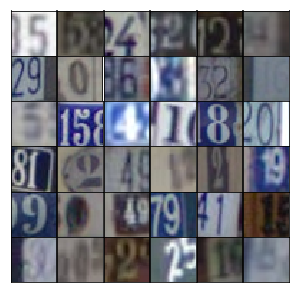

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
# # Scale works the same as tanh
# def scale(x, feature_range=(-1, 1)):
#     # scale to (0, 1)
#     x = ((x - x.min())/(255 - x.min()))
    
#     # scale to feature_range
#     min, max = feature_range
#     x = x * (max - min) + min
#     return x

In [22]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        #         if scale_func is None:
        #             self.scaler = scale
        #         else:
        #             self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            #yield self.scaler(x), y
            yield x, y

## Network Inputs

Here, just creating some placeholders like normal.

In [23]:
def model_inputs(real_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    
    return inputs_real

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [24]:
# tf.layers.conv2d(
#     inputs, ----------
#     filters, -------------
#     kernel_size, ------------
#     strides=(1, 1), ---------------
#     padding='valid', ------------
#     data_format='channels_last', -------------> NHWC and not NCHW
#     dilation_rate=(1, 1), -------------------
#     activation=None,
#     use_bias=True, ------------------
#     kernel_initializer=None,
#     bias_initializer=tf.zeros_initializer(), ------------------
#     kernel_regularizer=None,
#     bias_regularizer=None,
#     activity_regularizer=None,
#     kernel_constraint=None,
#     bias_constraint=None,
#     trainable=True, ---------------------
#     name=None,
#     reuse=None
# )

In [25]:
# Qfunction or qfunction, q/Q is quality and this is used as a classifier or q-learning or q-network
def qfunction(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('qfunction', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it to the number of classes 
        # Let's imagine (4*4*512) is the number of classes.
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 4*4*512)
        #predictions = tf.nn.softmax(logits)
        # 4x4x512 now
        
        return logits

In [26]:
def generator(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # Reshape it to start the convolutional stack
        h1_mat = tf.reshape(inputs, (-1, 4, 4, 512))
        # 4x4x512 now
        
        h2 = tf.layers.conv2d_transpose(inputs=h1_mat, filters=256, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x256 now
        
        h3 = tf.layers.conv2d_transpose(inputs=nl2, filters=128, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=nl3, filters=output_dim, kernel_size=5, strides=2, padding='same')        
        #predictions = tf.tanh(logits)
        # 32x32x3 now

        # generated input or input fake
        return logits

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [27]:
def discriminator(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        #predictions = tf.sigmoid(logits)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [28]:
def model_loss(inputs_real, output_dim):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param output_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # Generating/reconstructing the fake inputs using real inputs
    q_logits = qfunction(inputs=inputs_real)
    g_logits = generator(inputs=q_logits, output_dim=output_dim)
    inputs_fake = g_logits

    # Qfunction loss using real and fake inputs
    q_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=g_logits, labels=tf.sigmoid(inputs_real)))
    # q_loss = tf.reduce_mean(tf.losses.mean_squared_error(predictions=input_fake, labels=input_real))
    # TODO: is there any classification error we can backpropagate here!

    # Discriminator logits fake and real for G & D losses
    d_logits_fake = discriminator(inputs=inputs_fake, reuse=False)
    d_logits_real = discriminator(inputs=inputs_real, reuse=True)

    # Generator loss
    g_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.zeros_like(d_logits_real)))
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss = g_loss_real + g_loss_fake

    # Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return q_loss, g_loss, d_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [29]:
def model_opt(q_loss, g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param q_loss: Qfunction loss Tensor
    :param g_loss: Generator loss Tensor
    :param d_loss: Discriminator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    q_vars = [var for var in t_vars if var.name.startswith('qfunction')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        q_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(q_loss, var_list=q_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return q_opt, g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [30]:
class GAN:
    def __init__(self, real_size, learning_rate, beta1):
        tf.reset_default_graph()
        
        # Model inputs/data 
        self.inputs_real = model_inputs(real_dim=real_size)
        
        # Model losses/logits
        self.q_loss, self.g_loss, self.d_loss = model_loss(inputs_real=self.inputs_real, output_dim=real_size[2])

        # Model update/optimization
        self.q_opt, self.g_opt, self.d_opt = model_opt(q_loss=self.q_loss, 
                                                       g_loss=self.g_loss, 
                                                       d_loss=self.d_loss, 
                                                       learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [31]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [39]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        
        # Initialize the model variable if there is no model available to load/restore
        sess.run(tf.global_variables_initializer())
        
        # Restore/load the trained model
        #saver.restore(sess, './checkpoints/Auto-DCGAN.ckpt')
        saver.restore(sess, tf.train.latest_checkpoint('checkpoints/'))
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for inputs_real, _ in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={model.inputs_real: inputs_real}
                _ = sess.run(model.q_opt, feed_dict)
                _ = sess.run(model.g_opt, feed_dict)
                _ = sess.run(model.d_opt, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    q_loss = model.q_loss.eval(feed_dict)
                    g_loss = model.g_loss.eval(feed_dict)
                    d_loss = model.d_loss.eval(feed_dict)

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Qfunction Loss: {}".format(q_loss),
                          "Generator Loss: {}".format(g_loss),
                          "Discriminator Loss: {}".format(d_loss))
                    
                    # Save losses to view after training
                    losses.append((q_loss, g_loss, d_loss))

                if steps % show_every == 0:
                    model_qlogits = qfunction(inputs=model.inputs_real, reuse=True, training=False)
                    model_reconst_inputs = generator(inputs=model_qlogits, output_dim=3, reuse=True, training=False)
                    reconst_inputs = sess.run(model_reconst_inputs, feed_dict)
                    samples.append(reconst_inputs)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        # Save the trained model
        saver.save(sess, './checkpoints/model.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [40]:
# ADAM default parameters
# __init__(
#     learning_rate=0.001,
#     beta1=0.9,
#     beta2=0.999,
#     epsilon=1e-08,
#     use_locking=False,
#     name='Adam'
# )

In [41]:
real_size = (32,32,3)
learning_rate = 0.001
beta1 = 0.5
batch_size = 128
epochs = 10
alpha = 0.1

# Create the network
model = GAN(real_size=real_size, learning_rate=learning_rate, beta1=beta1)

In [42]:
# Dataset for the model
dataset = Dataset(trainset, testset)

INFO:tensorflow:Restoring parameters from checkpoints/model.ckpt
Epoch 1/10... Qfunction Loss: 0.13118787109851837 Generator Loss: 12.086894989013672 Discriminator Loss: 0.005655916407704353
Epoch 1/10... Qfunction Loss: 0.18625126779079437 Generator Loss: 11.690958976745605 Discriminator Loss: 0.007496618665754795
Epoch 1/10... Qfunction Loss: 0.2207609862089157 Generator Loss: 12.157585144042969 Discriminator Loss: 0.006716579664498568
Epoch 1/10... Qfunction Loss: 0.30280742049217224 Generator Loss: 11.752119064331055 Discriminator Loss: 0.006977460812777281
Epoch 1/10... Qfunction Loss: 0.4465115964412689 Generator Loss: 13.743608474731445 Discriminator Loss: 0.006172453053295612
Epoch 1/10... Qfunction Loss: 0.44006678462028503 Generator Loss: 12.758909225463867 Discriminator Loss: 0.0051676020957529545
Epoch 1/10... Qfunction Loss: 0.46442580223083496 Generator Loss: 13.83756160736084 Discriminator Loss: 0.003674210049211979
Epoch 1/10... Qfunction Loss: 0.4004293978214264 Genera

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


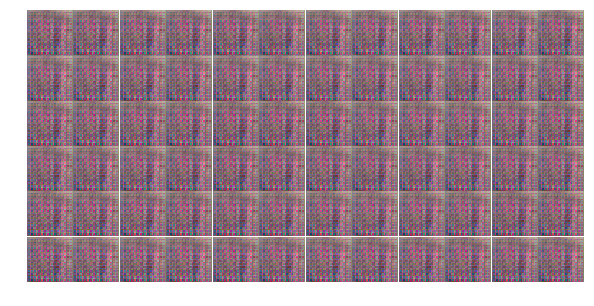

Epoch 1/10... Qfunction Loss: 0.3468116223812103 Generator Loss: 12.619524002075195 Discriminator Loss: 0.005659177899360657
Epoch 1/10... Qfunction Loss: 0.3437385857105255 Generator Loss: 12.311483383178711 Discriminator Loss: 0.005960687063634396
Epoch 1/10... Qfunction Loss: 0.36533185839653015 Generator Loss: 12.478750228881836 Discriminator Loss: 0.006133229937404394
Epoch 1/10... Qfunction Loss: 0.4106014668941498 Generator Loss: 12.40018367767334 Discriminator Loss: 0.006038312800228596
Epoch 1/10... Qfunction Loss: 0.4335629940032959 Generator Loss: 12.31671142578125 Discriminator Loss: 0.0063458941876888275
Epoch 1/10... Qfunction Loss: 0.3737400472164154 Generator Loss: 12.86067008972168 Discriminator Loss: 0.004119535908102989
Epoch 1/10... Qfunction Loss: 0.41657575964927673 Generator Loss: 11.87236213684082 Discriminator Loss: 0.008382558822631836
Epoch 1/10... Qfunction Loss: 0.48344382643699646 Generator Loss: 13.449844360351562 Discriminator Loss: 0.0030975304543972015

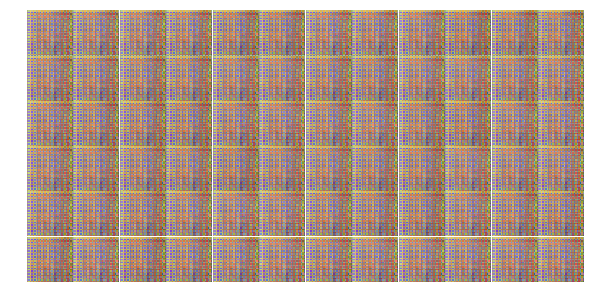

Epoch 1/10... Qfunction Loss: 0.5113756060600281 Generator Loss: 15.125570297241211 Discriminator Loss: 0.0015268155839294195
Epoch 1/10... Qfunction Loss: 0.5446231961250305 Generator Loss: 14.710090637207031 Discriminator Loss: 0.0017911132890731096
Epoch 1/10... Qfunction Loss: 0.6144900321960449 Generator Loss: 15.008934020996094 Discriminator Loss: 0.01502325851470232
Epoch 1/10... Qfunction Loss: 0.40204665064811707 Generator Loss: 15.096574783325195 Discriminator Loss: 0.007434884551912546
Epoch 1/10... Qfunction Loss: 0.1912669539451599 Generator Loss: 14.459547996520996 Discriminator Loss: 0.0042341030202806
Epoch 1/10... Qfunction Loss: 0.15177415311336517 Generator Loss: 13.226301193237305 Discriminator Loss: 0.0068427156656980515
Epoch 1/10... Qfunction Loss: 0.09015751630067825 Generator Loss: 14.312685012817383 Discriminator Loss: 0.0019896149169653654
Epoch 1/10... Qfunction Loss: 0.08050542324781418 Generator Loss: 14.918380737304688 Discriminator Loss: 0.00180112407542

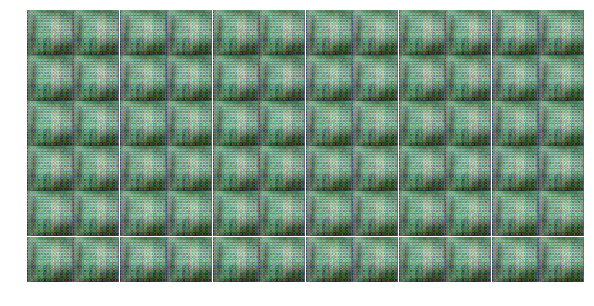

Epoch 1/10... Qfunction Loss: 0.07933048158884048 Generator Loss: 13.902423858642578 Discriminator Loss: 0.0031231576576828957
Epoch 1/10... Qfunction Loss: 0.07223334908485413 Generator Loss: 14.812768936157227 Discriminator Loss: 0.0014010637532919645
Epoch 1/10... Qfunction Loss: 0.08148028701543808 Generator Loss: 15.587531089782715 Discriminator Loss: 0.001040889648720622
Epoch 1/10... Qfunction Loss: 0.08743330091238022 Generator Loss: 15.337139129638672 Discriminator Loss: 0.0014099114341661334
Epoch 1/10... Qfunction Loss: 0.0869583785533905 Generator Loss: 13.6119384765625 Discriminator Loss: 0.0031257933005690575
Epoch 1/10... Qfunction Loss: 0.09652230143547058 Generator Loss: 14.713006973266602 Discriminator Loss: 0.0014881816459819674
Epoch 1/10... Qfunction Loss: 0.08292152732610703 Generator Loss: 16.64480209350586 Discriminator Loss: 0.000980341574177146
Epoch 1/10... Qfunction Loss: 0.06563250720500946 Generator Loss: 15.744205474853516 Discriminator Loss: 0.0014539351

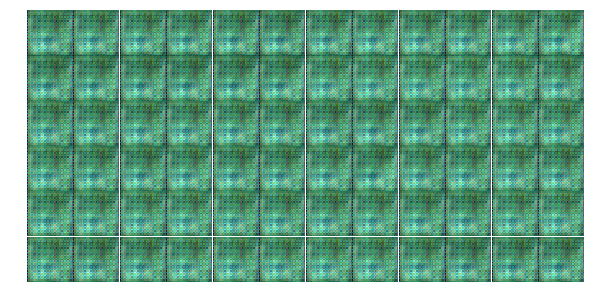

Epoch 1/10... Qfunction Loss: 0.06891564279794693 Generator Loss: 16.189664840698242 Discriminator Loss: 0.0007628225721418858
Epoch 1/10... Qfunction Loss: 0.07084789127111435 Generator Loss: 15.146049499511719 Discriminator Loss: 0.0014535586815327406
Epoch 1/10... Qfunction Loss: 0.08160379528999329 Generator Loss: 17.64712905883789 Discriminator Loss: 0.0005839364603161812
Epoch 1/10... Qfunction Loss: 0.0740613341331482 Generator Loss: 18.88394546508789 Discriminator Loss: 0.0002866207214538008
Epoch 1/10... Qfunction Loss: 0.07511311024427414 Generator Loss: 21.064815521240234 Discriminator Loss: 0.0001356508582830429
Epoch 1/10... Qfunction Loss: 0.08921927213668823 Generator Loss: 16.827983856201172 Discriminator Loss: 0.0005825628759339452
Epoch 1/10... Qfunction Loss: 0.0966777428984642 Generator Loss: 15.162615776062012 Discriminator Loss: 0.0012934587430208921
Epoch 1/10... Qfunction Loss: 0.08874217420816422 Generator Loss: 17.026531219482422 Discriminator Loss: 0.00057425

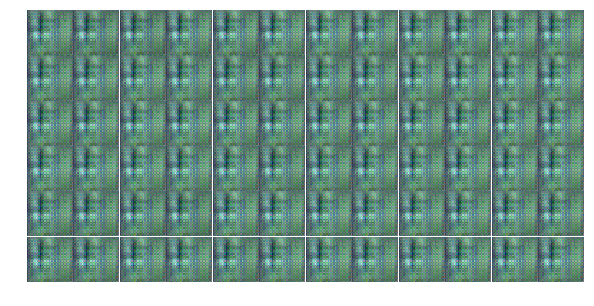

Epoch 1/10... Qfunction Loss: 0.13502223789691925 Generator Loss: 15.045600891113281 Discriminator Loss: 0.0015027029439806938
Epoch 1/10... Qfunction Loss: 0.15637333691120148 Generator Loss: 14.349409103393555 Discriminator Loss: 0.0020397179760038853
Epoch 1/10... Qfunction Loss: 0.17678308486938477 Generator Loss: 16.03530502319336 Discriminator Loss: 0.0008174875401891768
Epoch 1/10... Qfunction Loss: 0.17569954693317413 Generator Loss: 16.055679321289062 Discriminator Loss: 0.000903152977116406
Epoch 1/10... Qfunction Loss: 0.1553565114736557 Generator Loss: 16.114826202392578 Discriminator Loss: 0.0009988895617425442
Epoch 1/10... Qfunction Loss: 0.13668017089366913 Generator Loss: 14.587718963623047 Discriminator Loss: 0.0020245902705937624
Epoch 1/10... Qfunction Loss: 0.1306799352169037 Generator Loss: 16.1331844329834 Discriminator Loss: 0.0008218791335821152
Epoch 2/10... Qfunction Loss: 0.136317178606987 Generator Loss: 15.6353178024292 Discriminator Loss: 0.00138824223540

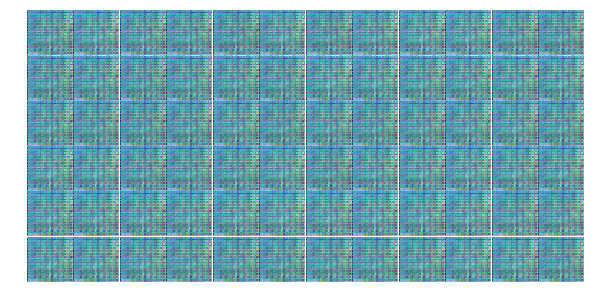

Epoch 2/10... Qfunction Loss: 0.1614016741514206 Generator Loss: 17.089492797851562 Discriminator Loss: 0.0006094115087762475
Epoch 2/10... Qfunction Loss: 0.17771391570568085 Generator Loss: 15.758406639099121 Discriminator Loss: 0.0009572292328812182
Epoch 2/10... Qfunction Loss: 0.19873054325580597 Generator Loss: 15.946126937866211 Discriminator Loss: 0.0008442269172519445
Epoch 2/10... Qfunction Loss: 0.2634468376636505 Generator Loss: 14.67708683013916 Discriminator Loss: 0.0025515444576740265
Epoch 2/10... Qfunction Loss: 0.39278340339660645 Generator Loss: 18.81643295288086 Discriminator Loss: 0.00022566168627236038
Epoch 2/10... Qfunction Loss: 0.5608620047569275 Generator Loss: 16.227710723876953 Discriminator Loss: 0.0012880876893177629
Epoch 2/10... Qfunction Loss: 0.37478598952293396 Generator Loss: 15.795086860656738 Discriminator Loss: 0.005422566086053848
Epoch 2/10... Qfunction Loss: 0.14978335797786713 Generator Loss: 16.94589614868164 Discriminator Loss: 0.1572309881

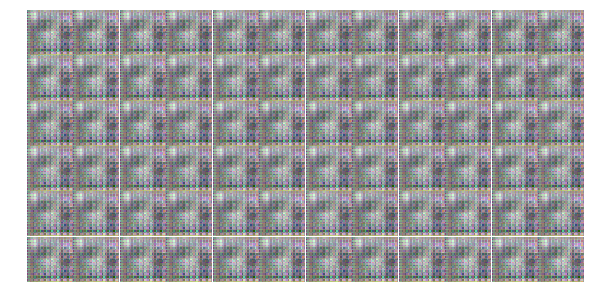

Epoch 2/10... Qfunction Loss: 0.09736452251672745 Generator Loss: 13.073823928833008 Discriminator Loss: 0.006756889633834362
Epoch 2/10... Qfunction Loss: 0.11995438486337662 Generator Loss: 11.608341217041016 Discriminator Loss: 0.011541308835148811
Epoch 2/10... Qfunction Loss: 0.2463056594133377 Generator Loss: 11.602259635925293 Discriminator Loss: 0.010789897292852402
Epoch 2/10... Qfunction Loss: 0.43446341156959534 Generator Loss: 17.56562042236328 Discriminator Loss: 0.007941263727843761
Epoch 2/10... Qfunction Loss: 0.4758022725582123 Generator Loss: 13.782394409179688 Discriminator Loss: 0.009871943853795528
Epoch 2/10... Qfunction Loss: 0.22625382244586945 Generator Loss: 12.05832290649414 Discriminator Loss: 0.052142832428216934
Epoch 2/10... Qfunction Loss: 0.17800891399383545 Generator Loss: 13.101448059082031 Discriminator Loss: 0.00487232580780983
Epoch 2/10... Qfunction Loss: 0.1354818344116211 Generator Loss: 12.932622909545898 Discriminator Loss: 0.00592866027727723

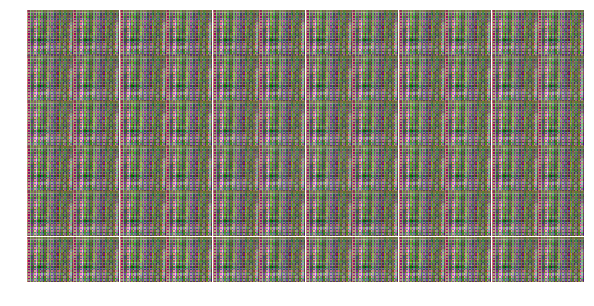

Epoch 2/10... Qfunction Loss: 0.12672759592533112 Generator Loss: 15.192238807678223 Discriminator Loss: 0.0018391506746411324
Epoch 2/10... Qfunction Loss: 0.11558856815099716 Generator Loss: 12.882129669189453 Discriminator Loss: 0.005452076904475689
Epoch 2/10... Qfunction Loss: 0.12619107961654663 Generator Loss: 14.077561378479004 Discriminator Loss: 0.0029631424695253372
Epoch 2/10... Qfunction Loss: 0.12692143023014069 Generator Loss: 13.872113227844238 Discriminator Loss: 0.004807860124856234
Epoch 2/10... Qfunction Loss: 0.17946648597717285 Generator Loss: 15.807958602905273 Discriminator Loss: 0.0016851843101903796
Epoch 2/10... Qfunction Loss: 0.21923549473285675 Generator Loss: 15.388819694519043 Discriminator Loss: 0.002698304830119014
Epoch 2/10... Qfunction Loss: 0.27486905455589294 Generator Loss: 13.977727890014648 Discriminator Loss: 0.004794314503669739
Epoch 2/10... Qfunction Loss: 0.2731151282787323 Generator Loss: 18.563825607299805 Discriminator Loss: 1.281159281

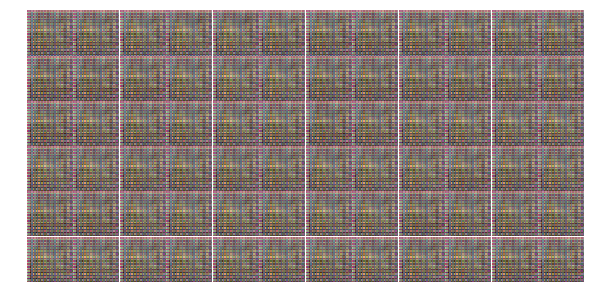

Epoch 2/10... Qfunction Loss: 0.32607102394104004 Generator Loss: 15.026801109313965 Discriminator Loss: 0.0017729783430695534
Epoch 2/10... Qfunction Loss: 0.3863494098186493 Generator Loss: 14.862154006958008 Discriminator Loss: 0.0016321823932230473
Epoch 2/10... Qfunction Loss: 0.47104278206825256 Generator Loss: 16.139999389648438 Discriminator Loss: 0.0008104299195110798
Epoch 2/10... Qfunction Loss: 0.5378760695457458 Generator Loss: 14.019872665405273 Discriminator Loss: 0.005832775495946407
Epoch 2/10... Qfunction Loss: 0.6770250201225281 Generator Loss: 15.650812149047852 Discriminator Loss: 0.001305540674366057
Epoch 2/10... Qfunction Loss: 0.7712571024894714 Generator Loss: 13.866647720336914 Discriminator Loss: 0.0054028891026973724
Epoch 2/10... Qfunction Loss: 0.4967184066772461 Generator Loss: 7.846811294555664 Discriminator Loss: 0.18347808718681335
Epoch 2/10... Qfunction Loss: 0.17903006076812744 Generator Loss: 20.62323760986328 Discriminator Loss: 0.006603145040571

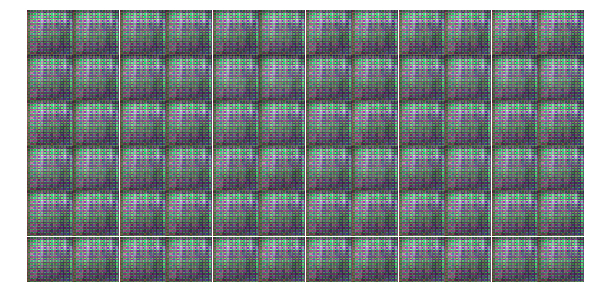

Epoch 2/10... Qfunction Loss: 0.10928661376237869 Generator Loss: 13.293643951416016 Discriminator Loss: 0.006742712110280991
Epoch 2/10... Qfunction Loss: 0.13467375934123993 Generator Loss: 20.488853454589844 Discriminator Loss: 0.004219663795083761
Epoch 2/10... Qfunction Loss: 0.13317273557186127 Generator Loss: 13.216903686523438 Discriminator Loss: 0.004175527486950159
Epoch 2/10... Qfunction Loss: 0.10111916065216064 Generator Loss: 15.37067985534668 Discriminator Loss: 0.0032251253724098206
Epoch 2/10... Qfunction Loss: 0.12061097472906113 Generator Loss: 13.533540725708008 Discriminator Loss: 0.004561013542115688
Epoch 2/10... Qfunction Loss: 0.16101430356502533 Generator Loss: 14.08234691619873 Discriminator Loss: 0.003567850450053811
Epoch 2/10... Qfunction Loss: 0.21321676671504974 Generator Loss: 14.534879684448242 Discriminator Loss: 0.0021413369104266167
Epoch 2/10... Qfunction Loss: 0.2790745198726654 Generator Loss: 13.68189811706543 Discriminator Loss: 0.0034604107495

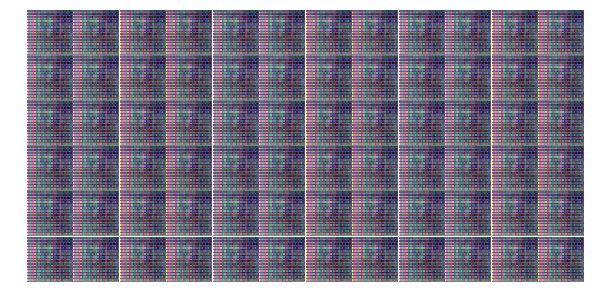

Epoch 2/10... Qfunction Loss: 0.48905277252197266 Generator Loss: 17.83938217163086 Discriminator Loss: 0.00044613261707127094
Epoch 2/10... Qfunction Loss: 0.5138241648674011 Generator Loss: 16.669658660888672 Discriminator Loss: 0.0008182401652447879
Epoch 2/10... Qfunction Loss: 0.5497936606407166 Generator Loss: 15.074943542480469 Discriminator Loss: 0.0037280283868312836
Epoch 2/10... Qfunction Loss: 0.5176450610160828 Generator Loss: 15.074152946472168 Discriminator Loss: 0.0016119679203256965
Epoch 3/10... Qfunction Loss: 0.4631252586841583 Generator Loss: 15.633096694946289 Discriminator Loss: 0.0017840517684817314
Epoch 3/10... Qfunction Loss: 0.47881603240966797 Generator Loss: 17.79627227783203 Discriminator Loss: 0.00036821459070779383
Epoch 3/10... Qfunction Loss: 0.5098130106925964 Generator Loss: 18.224689483642578 Discriminator Loss: 0.0004730068612843752
Epoch 3/10... Qfunction Loss: 0.5460564494132996 Generator Loss: 20.092098236083984 Discriminator Loss: 0.0003909811

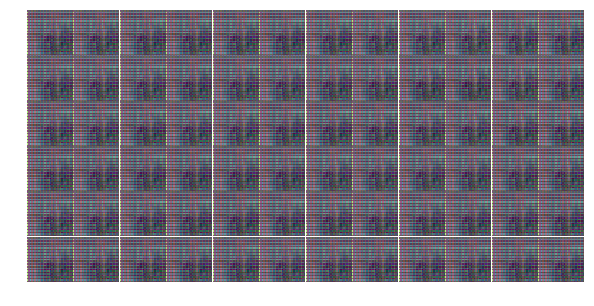

Epoch 3/10... Qfunction Loss: 0.4367024004459381 Generator Loss: 19.185529708862305 Discriminator Loss: 0.00022425908537115902
Epoch 3/10... Qfunction Loss: 0.4559664726257324 Generator Loss: 20.11623764038086 Discriminator Loss: 0.0001836183073464781
Epoch 3/10... Qfunction Loss: 0.47568759322166443 Generator Loss: 20.962947845458984 Discriminator Loss: 0.000141372176585719
Epoch 3/10... Qfunction Loss: 0.47495582699775696 Generator Loss: 14.891084671020508 Discriminator Loss: 0.0025920141488313675
Epoch 3/10... Qfunction Loss: 0.5271222591400146 Generator Loss: 16.267473220825195 Discriminator Loss: 0.0012270206352695823
Epoch 3/10... Qfunction Loss: 0.6328554749488831 Generator Loss: 15.405317306518555 Discriminator Loss: 0.0013510347343981266
Epoch 3/10... Qfunction Loss: 0.6299594044685364 Generator Loss: 11.406169891357422 Discriminator Loss: 0.25427907705307007
Epoch 3/10... Qfunction Loss: 0.3568840026855469 Generator Loss: 11.35032844543457 Discriminator Loss: 0.03453163057565

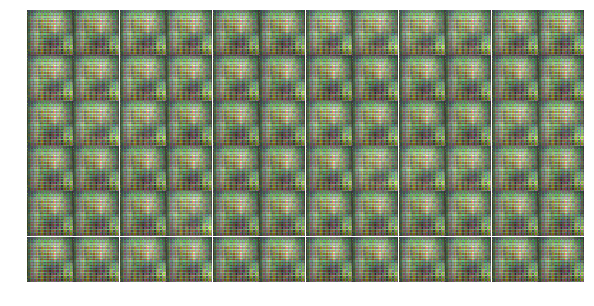

Epoch 3/10... Qfunction Loss: 0.19226552546024323 Generator Loss: 17.01327133178711 Discriminator Loss: 0.0009376479429192841
Epoch 3/10... Qfunction Loss: 0.2537284195423126 Generator Loss: 18.10379981994629 Discriminator Loss: 0.0157803762704134
Epoch 3/10... Qfunction Loss: 0.26544252038002014 Generator Loss: 14.441520690917969 Discriminator Loss: 0.004980707541108131
Epoch 3/10... Qfunction Loss: 0.26467135548591614 Generator Loss: 22.23318862915039 Discriminator Loss: 0.029199207201600075
Epoch 3/10... Qfunction Loss: 0.2797323763370514 Generator Loss: 21.072853088378906 Discriminator Loss: 0.01478335540741682
Epoch 3/10... Qfunction Loss: 0.28437164425849915 Generator Loss: 18.46759605407715 Discriminator Loss: 0.006248273886740208
Epoch 3/10... Qfunction Loss: 0.2772487699985504 Generator Loss: 15.080587387084961 Discriminator Loss: 0.020755581557750702
Epoch 3/10... Qfunction Loss: 0.26958197355270386 Generator Loss: 19.833431243896484 Discriminator Loss: 0.020265918225049973
E

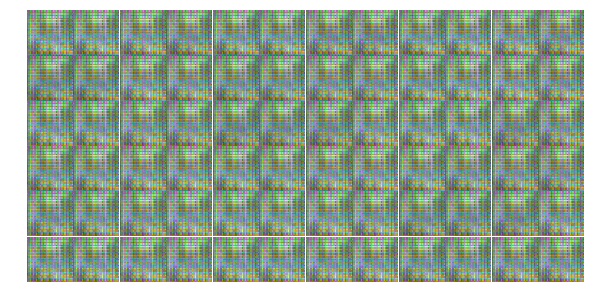

Epoch 3/10... Qfunction Loss: 0.22283513844013214 Generator Loss: 17.508853912353516 Discriminator Loss: 0.0007784555200487375
Epoch 3/10... Qfunction Loss: 0.23908297717571259 Generator Loss: 16.467208862304688 Discriminator Loss: 0.0010683168657124043
Epoch 3/10... Qfunction Loss: 0.26875218749046326 Generator Loss: 14.701879501342773 Discriminator Loss: 0.003667601849883795
Epoch 3/10... Qfunction Loss: 0.37681254744529724 Generator Loss: 17.183914184570312 Discriminator Loss: 0.0009908884530887008
Epoch 3/10... Qfunction Loss: 0.39036765694618225 Generator Loss: 14.651578903198242 Discriminator Loss: 0.0035752342082560062
Epoch 3/10... Qfunction Loss: 0.5274200439453125 Generator Loss: 15.307487487792969 Discriminator Loss: 0.0025310555938631296
Epoch 3/10... Qfunction Loss: 0.6723788380622864 Generator Loss: 20.014551162719727 Discriminator Loss: 0.0013274360680952668
Epoch 3/10... Qfunction Loss: 0.5614219307899475 Generator Loss: 18.897951126098633 Discriminator Loss: 0.00085132

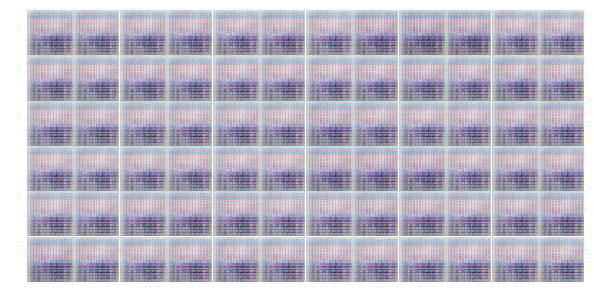

Epoch 3/10... Qfunction Loss: 0.45656445622444153 Generator Loss: 16.33142852783203 Discriminator Loss: 0.0009562417981214821
Epoch 3/10... Qfunction Loss: 0.44831013679504395 Generator Loss: 14.84109115600586 Discriminator Loss: 0.00268207723274827
Epoch 3/10... Qfunction Loss: 0.38366660475730896 Generator Loss: 16.056095123291016 Discriminator Loss: 0.004082626197487116
Epoch 3/10... Qfunction Loss: 0.2871157228946686 Generator Loss: 14.654364585876465 Discriminator Loss: 0.0026846975088119507
Epoch 3/10... Qfunction Loss: 0.2772192656993866 Generator Loss: 14.53066635131836 Discriminator Loss: 0.0037140019703656435
Epoch 3/10... Qfunction Loss: 0.3142004609107971 Generator Loss: 16.53323745727539 Discriminator Loss: 0.0008380484068766236
Epoch 3/10... Qfunction Loss: 0.3511807918548584 Generator Loss: 16.336715698242188 Discriminator Loss: 0.0011412064777687192
Epoch 3/10... Qfunction Loss: 0.3596796989440918 Generator Loss: 17.199779510498047 Discriminator Loss: 0.0008850637823343

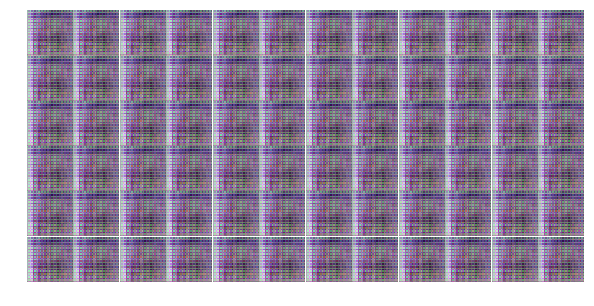

Epoch 3/10... Qfunction Loss: 0.4184354841709137 Generator Loss: 19.579978942871094 Discriminator Loss: 0.00221989001147449
Epoch 3/10... Qfunction Loss: 0.4158678948879242 Generator Loss: 16.47886848449707 Discriminator Loss: 0.0019633197225630283
Epoch 3/10... Qfunction Loss: 0.5383328795433044 Generator Loss: 16.382244110107422 Discriminator Loss: 0.0027832631021738052
Epoch 3/10... Qfunction Loss: 0.5491178035736084 Generator Loss: 15.146930694580078 Discriminator Loss: 0.0017781076021492481
Epoch 3/10... Qfunction Loss: 0.5781183242797852 Generator Loss: 21.58753776550293 Discriminator Loss: 0.0003433248493820429
Epoch 3/10... Qfunction Loss: 0.5193415284156799 Generator Loss: 16.890567779541016 Discriminator Loss: 0.006582495290786028
Epoch 3/10... Qfunction Loss: 0.5268754363059998 Generator Loss: 21.61524200439453 Discriminator Loss: 0.002190945902839303
Epoch 3/10... Qfunction Loss: 0.409653902053833 Generator Loss: 15.813175201416016 Discriminator Loss: 0.005314595066010952
E

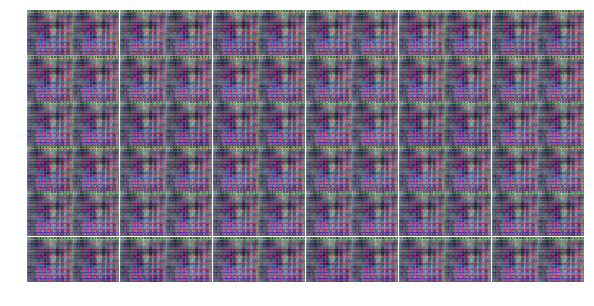

Epoch 3/10... Qfunction Loss: 0.19034461677074432 Generator Loss: 14.336304664611816 Discriminator Loss: 0.9952713847160339
Epoch 4/10... Qfunction Loss: 0.22548620402812958 Generator Loss: 14.15099048614502 Discriminator Loss: 0.02040151320397854
Epoch 4/10... Qfunction Loss: 0.11932166665792465 Generator Loss: 12.559051513671875 Discriminator Loss: 0.01362086646258831
Epoch 4/10... Qfunction Loss: 0.09198439121246338 Generator Loss: 16.5294189453125 Discriminator Loss: 0.0030548234935849905
Epoch 4/10... Qfunction Loss: 0.1267709732055664 Generator Loss: 17.234140396118164 Discriminator Loss: 0.0024882040452212095
Epoch 4/10... Qfunction Loss: 0.11306063085794449 Generator Loss: 14.76758861541748 Discriminator Loss: 0.0026577168609946966
Epoch 4/10... Qfunction Loss: 0.14111477136611938 Generator Loss: 17.954856872558594 Discriminator Loss: 0.002136525232344866
Epoch 4/10... Qfunction Loss: 0.2106485217809677 Generator Loss: 20.389995574951172 Discriminator Loss: 0.001257708645425737

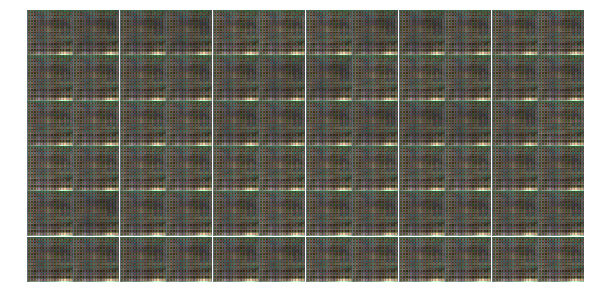

Epoch 4/10... Qfunction Loss: 0.3907994329929352 Generator Loss: 16.314456939697266 Discriminator Loss: 0.0010817411821335554
Epoch 4/10... Qfunction Loss: 0.4136808216571808 Generator Loss: 15.503195762634277 Discriminator Loss: 0.0017547565512359142
Epoch 4/10... Qfunction Loss: 0.4835018217563629 Generator Loss: 17.071868896484375 Discriminator Loss: 0.0008109711343422532
Epoch 4/10... Qfunction Loss: 0.6522275805473328 Generator Loss: 16.954967498779297 Discriminator Loss: 0.0025678707752376795
Epoch 4/10... Qfunction Loss: 0.6519371867179871 Generator Loss: 17.477432250976562 Discriminator Loss: 0.0019585618283599615
Epoch 4/10... Qfunction Loss: 0.45752444863319397 Generator Loss: 16.402074813842773 Discriminator Loss: 0.05270259082317352
Epoch 4/10... Qfunction Loss: 0.1970464140176773 Generator Loss: 13.768210411071777 Discriminator Loss: 0.009716550819575787
Epoch 4/10... Qfunction Loss: 0.07386945933103561 Generator Loss: 17.27396583557129 Discriminator Loss: 0.00076321314554

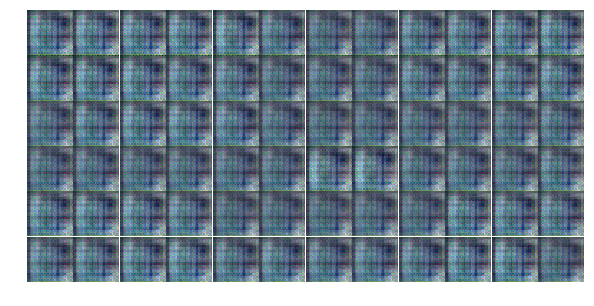

Epoch 4/10... Qfunction Loss: 0.0269661545753479 Generator Loss: 17.735740661621094 Discriminator Loss: 0.000497336033731699
Epoch 4/10... Qfunction Loss: 0.030790677294135094 Generator Loss: 13.795318603515625 Discriminator Loss: 0.0032145497389137745
Epoch 4/10... Qfunction Loss: 0.04416115581989288 Generator Loss: 15.336559295654297 Discriminator Loss: 0.0018498270073905587
Epoch 4/10... Qfunction Loss: 0.0783986747264862 Generator Loss: 18.21197509765625 Discriminator Loss: 0.0006710077868774533
Epoch 4/10... Qfunction Loss: 0.0940437912940979 Generator Loss: 18.048458099365234 Discriminator Loss: 0.0005389305297285318
Epoch 4/10... Qfunction Loss: 0.06158806383609772 Generator Loss: 21.594289779663086 Discriminator Loss: 0.0003364954318385571
Epoch 4/10... Qfunction Loss: 0.06372328847646713 Generator Loss: 18.334274291992188 Discriminator Loss: 0.0005365802207961679
Epoch 4/10... Qfunction Loss: 0.128114715218544 Generator Loss: 24.11252212524414 Discriminator Loss: 0.00024436571

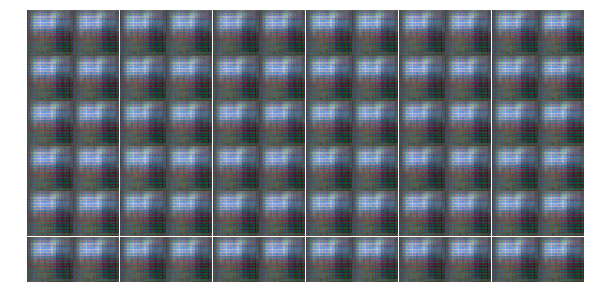

Epoch 4/10... Qfunction Loss: 0.07354407012462616 Generator Loss: 21.705059051513672 Discriminator Loss: 0.00010833387932507321
Epoch 4/10... Qfunction Loss: 0.06440242379903793 Generator Loss: 18.46422576904297 Discriminator Loss: 0.0003099030873272568
Epoch 4/10... Qfunction Loss: 0.06504771113395691 Generator Loss: 18.37662124633789 Discriminator Loss: 0.00042408431181684136
Epoch 4/10... Qfunction Loss: 0.07571288198232651 Generator Loss: 16.667339324951172 Discriminator Loss: 0.0012752636102959514
Epoch 4/10... Qfunction Loss: 0.08990631252527237 Generator Loss: 20.90411376953125 Discriminator Loss: 0.00015961223107296973
Epoch 4/10... Qfunction Loss: 0.09454364329576492 Generator Loss: 21.421552658081055 Discriminator Loss: 0.00017082937119994313
Epoch 4/10... Qfunction Loss: 0.10696161538362503 Generator Loss: 17.07488250732422 Discriminator Loss: 0.0009355790680274367
Epoch 4/10... Qfunction Loss: 0.13126367330551147 Generator Loss: 17.89427947998047 Discriminator Loss: 0.00050

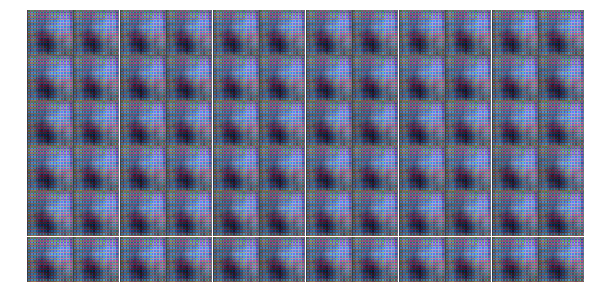

Epoch 4/10... Qfunction Loss: 0.152777299284935 Generator Loss: 19.340499877929688 Discriminator Loss: 0.00018454920791555196
Epoch 4/10... Qfunction Loss: 0.10091003775596619 Generator Loss: 20.205886840820312 Discriminator Loss: 0.0005437412764877081
Epoch 4/10... Qfunction Loss: 0.061530765146017075 Generator Loss: 18.726314544677734 Discriminator Loss: 0.00031589349964633584
Epoch 4/10... Qfunction Loss: 0.05095526576042175 Generator Loss: 17.908676147460938 Discriminator Loss: 0.0003728493757080287
Epoch 4/10... Qfunction Loss: 0.04477447271347046 Generator Loss: 18.339927673339844 Discriminator Loss: 0.00041481113294139504
Epoch 4/10... Qfunction Loss: 0.04529649391770363 Generator Loss: 18.76217269897461 Discriminator Loss: 0.0003240344813093543
Epoch 4/10... Qfunction Loss: 0.05783830210566521 Generator Loss: 20.654008865356445 Discriminator Loss: 0.00019675394287332892
Epoch 4/10... Qfunction Loss: 0.057610731571912766 Generator Loss: 18.59152603149414 Discriminator Loss: 0.00

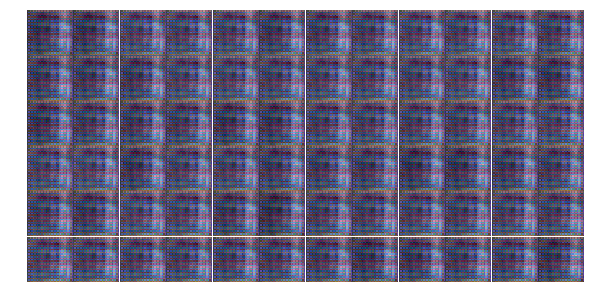

Epoch 4/10... Qfunction Loss: 0.05290761590003967 Generator Loss: 16.674074172973633 Discriminator Loss: 0.0010131255257874727
Epoch 4/10... Qfunction Loss: 0.06261278688907623 Generator Loss: 17.155540466308594 Discriminator Loss: 0.000627257046289742
Epoch 4/10... Qfunction Loss: 0.0873098373413086 Generator Loss: 18.08428955078125 Discriminator Loss: 0.001215678290463984
Epoch 4/10... Qfunction Loss: 0.06189506873488426 Generator Loss: 15.715729713439941 Discriminator Loss: 0.0024409268517047167
Epoch 4/10... Qfunction Loss: 0.07486500591039658 Generator Loss: 16.067066192626953 Discriminator Loss: 0.0010857125744223595
Epoch 4/10... Qfunction Loss: 0.06880960613489151 Generator Loss: 14.699028015136719 Discriminator Loss: 0.004324642010033131
Epoch 4/10... Qfunction Loss: 0.06102629378437996 Generator Loss: 17.740650177001953 Discriminator Loss: 0.0012738577788695693
Epoch 4/10... Qfunction Loss: 0.06619671732187271 Generator Loss: 20.622234344482422 Discriminator Loss: 0.001535439

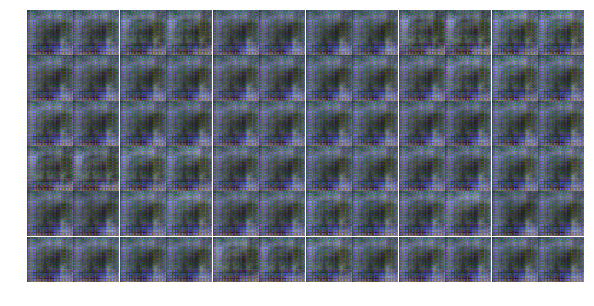

Epoch 5/10... Qfunction Loss: 0.03831997141242027 Generator Loss: 18.817707061767578 Discriminator Loss: 0.003026829333975911
Epoch 5/10... Qfunction Loss: 0.03971392288804054 Generator Loss: 22.40141487121582 Discriminator Loss: 0.005357479676604271
Epoch 5/10... Qfunction Loss: 0.05001174286007881 Generator Loss: 25.77928352355957 Discriminator Loss: 0.0037205175030976534
Epoch 5/10... Qfunction Loss: 0.041225265711545944 Generator Loss: 16.911277770996094 Discriminator Loss: 0.009014111012220383
Epoch 5/10... Qfunction Loss: 0.05273899435997009 Generator Loss: 10.05780029296875 Discriminator Loss: 0.06204621493816376
Epoch 5/10... Qfunction Loss: 0.05194513127207756 Generator Loss: 12.263572692871094 Discriminator Loss: 0.01165964175015688
Epoch 5/10... Qfunction Loss: 0.05981100723147392 Generator Loss: 16.884889602661133 Discriminator Loss: 0.0033907671459019184
Epoch 5/10... Qfunction Loss: 0.10393816232681274 Generator Loss: 17.989025115966797 Discriminator Loss: 0.0045290468260

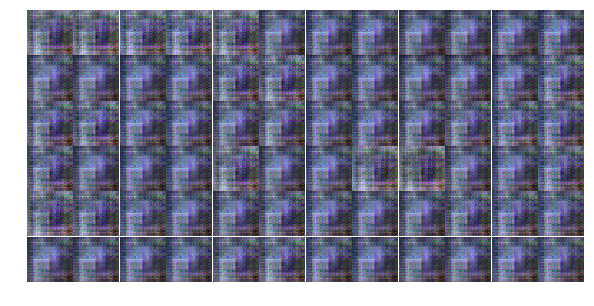

Epoch 5/10... Qfunction Loss: 0.13831163942813873 Generator Loss: 23.118093490600586 Discriminator Loss: 0.0008064171997830272
Epoch 5/10... Qfunction Loss: 0.16179250180721283 Generator Loss: 22.538129806518555 Discriminator Loss: 0.14863711595535278
Epoch 5/10... Qfunction Loss: 0.22782735526561737 Generator Loss: 23.669124603271484 Discriminator Loss: 0.0027133498806506395
Epoch 5/10... Qfunction Loss: 0.15868528187274933 Generator Loss: 19.786651611328125 Discriminator Loss: 0.000952343107201159
Epoch 5/10... Qfunction Loss: 0.13504467904567719 Generator Loss: 16.89740753173828 Discriminator Loss: 0.0039940704591572285
Epoch 5/10... Qfunction Loss: 0.2324608415365219 Generator Loss: 16.760723114013672 Discriminator Loss: 0.0020933509804308414
Epoch 5/10... Qfunction Loss: 0.46629634499549866 Generator Loss: 20.28387451171875 Discriminator Loss: 0.0025926060043275356
Epoch 5/10... Qfunction Loss: 0.5273551344871521 Generator Loss: 24.002897262573242 Discriminator Loss: 0.00019363363

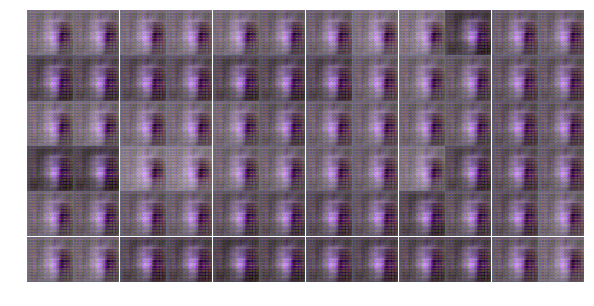

Epoch 5/10... Qfunction Loss: 0.5569092631340027 Generator Loss: 23.942672729492188 Discriminator Loss: 0.0007042352808639407
Epoch 5/10... Qfunction Loss: 0.564005434513092 Generator Loss: 21.04885482788086 Discriminator Loss: 0.0002498410758562386
Epoch 5/10... Qfunction Loss: 0.35199975967407227 Generator Loss: 14.894876480102539 Discriminator Loss: 0.0025610073935240507
Epoch 5/10... Qfunction Loss: 0.5600922703742981 Generator Loss: 25.10348892211914 Discriminator Loss: 0.00029653083765879273
Epoch 5/10... Qfunction Loss: 1.010109543800354 Generator Loss: 18.25578498840332 Discriminator Loss: 0.0005823886021971703
Epoch 5/10... Qfunction Loss: 0.699615478515625 Generator Loss: 17.883296966552734 Discriminator Loss: 0.0033876686356961727
Epoch 5/10... Qfunction Loss: 0.20653760433197021 Generator Loss: 13.699806213378906 Discriminator Loss: 0.03735034167766571
Epoch 5/10... Qfunction Loss: 0.1440851241350174 Generator Loss: 32.66508865356445 Discriminator Loss: 0.000718931318260729

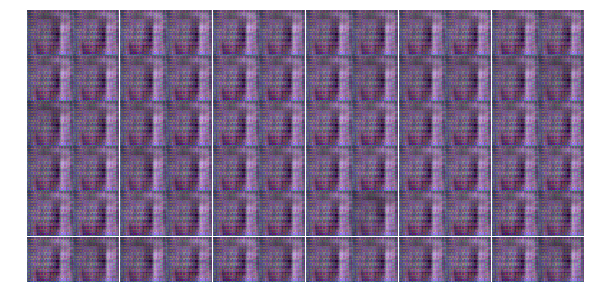

Epoch 5/10... Qfunction Loss: 0.09663411229848862 Generator Loss: 21.379621505737305 Discriminator Loss: 0.0017096649389714003
Epoch 5/10... Qfunction Loss: 0.1321883648633957 Generator Loss: 29.20165252685547 Discriminator Loss: 0.0002707899548113346
Epoch 5/10... Qfunction Loss: 0.061182815581560135 Generator Loss: 26.264570236206055 Discriminator Loss: 0.000219957553781569
Epoch 5/10... Qfunction Loss: 0.06728114932775497 Generator Loss: 22.954254150390625 Discriminator Loss: 0.0001278147828998044
Epoch 5/10... Qfunction Loss: 0.04543618857860565 Generator Loss: 23.837574005126953 Discriminator Loss: 5.710404730052687e-05
Epoch 5/10... Qfunction Loss: 0.04998033121228218 Generator Loss: 21.558666229248047 Discriminator Loss: 0.0001335207198280841
Epoch 5/10... Qfunction Loss: 0.06385626643896103 Generator Loss: 21.485130310058594 Discriminator Loss: 0.00015707939746789634
Epoch 5/10... Qfunction Loss: 0.07922885566949844 Generator Loss: 18.23820686340332 Discriminator Loss: 0.001075

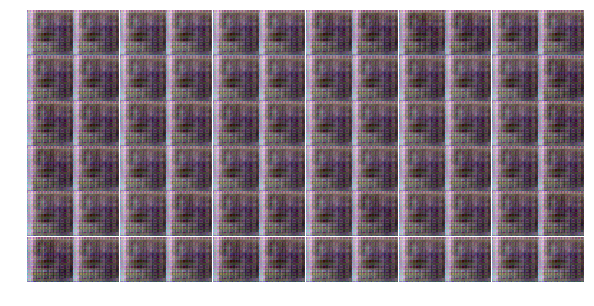

Epoch 5/10... Qfunction Loss: 0.12688414752483368 Generator Loss: 14.409233093261719 Discriminator Loss: 0.0020842174999415874
Epoch 5/10... Qfunction Loss: 0.15201860666275024 Generator Loss: 15.34802532196045 Discriminator Loss: 0.001689487718977034
Epoch 5/10... Qfunction Loss: 0.2051258087158203 Generator Loss: 17.71918487548828 Discriminator Loss: 0.0013122090604156256
Epoch 5/10... Qfunction Loss: 0.2398485541343689 Generator Loss: 17.16806411743164 Discriminator Loss: 0.0008050167234614491
Epoch 5/10... Qfunction Loss: 0.3102484941482544 Generator Loss: 18.304534912109375 Discriminator Loss: 0.0005043454584665596
Epoch 5/10... Qfunction Loss: 0.36170971393585205 Generator Loss: 18.253429412841797 Discriminator Loss: 0.0004120457742828876
Epoch 5/10... Qfunction Loss: 0.37118420004844666 Generator Loss: 17.945693969726562 Discriminator Loss: 0.0017061969265341759
Epoch 5/10... Qfunction Loss: 0.2674109935760498 Generator Loss: 10.722322463989258 Discriminator Loss: 2.816862106323

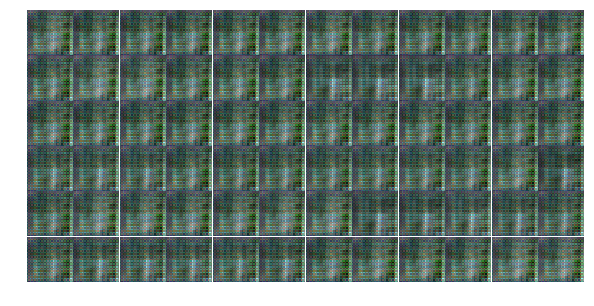

Epoch 5/10... Qfunction Loss: 0.040944088250398636 Generator Loss: 15.349632263183594 Discriminator Loss: 0.0015935327392071486
Epoch 5/10... Qfunction Loss: 0.03075159154832363 Generator Loss: 14.22170352935791 Discriminator Loss: 0.04267936944961548
Epoch 5/10... Qfunction Loss: 0.03917974606156349 Generator Loss: 12.93539047241211 Discriminator Loss: 0.040557920932769775
Epoch 5/10... Qfunction Loss: 0.050028253346681595 Generator Loss: 11.522382736206055 Discriminator Loss: 0.01721537858247757
Epoch 5/10... Qfunction Loss: 0.045248210430145264 Generator Loss: 8.763672828674316 Discriminator Loss: 1.4805351495742798
Epoch 5/10... Qfunction Loss: 0.04331072047352791 Generator Loss: 11.69794750213623 Discriminator Loss: 0.023272359743714333
Epoch 6/10... Qfunction Loss: 0.07337696105241776 Generator Loss: 13.322835922241211 Discriminator Loss: 0.05327784642577171
Epoch 6/10... Qfunction Loss: 0.08081358671188354 Generator Loss: 15.679695129394531 Discriminator Loss: 0.0204483196139335

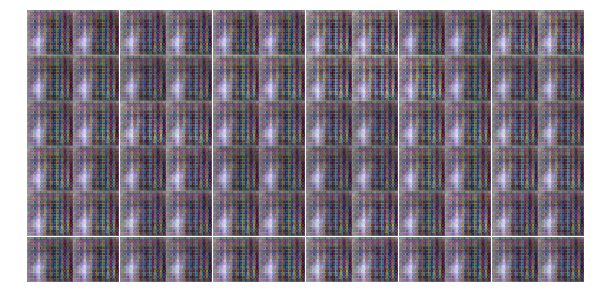

Epoch 6/10... Qfunction Loss: 0.10925380140542984 Generator Loss: 15.570837020874023 Discriminator Loss: 0.0030249254778027534
Epoch 6/10... Qfunction Loss: 0.060034021735191345 Generator Loss: 15.771583557128906 Discriminator Loss: 0.0038004405796527863
Epoch 6/10... Qfunction Loss: 0.046588484197854996 Generator Loss: 17.470611572265625 Discriminator Loss: 0.007608131039887667
Epoch 6/10... Qfunction Loss: 0.038667358458042145 Generator Loss: 12.833818435668945 Discriminator Loss: 0.05107323080301285
Epoch 6/10... Qfunction Loss: 0.043609868735075 Generator Loss: 15.946914672851562 Discriminator Loss: 0.004756894428282976
Epoch 6/10... Qfunction Loss: 0.05867847800254822 Generator Loss: 16.003864288330078 Discriminator Loss: 0.0016894970322027802
Epoch 6/10... Qfunction Loss: 0.06036834418773651 Generator Loss: 13.786043167114258 Discriminator Loss: 0.00508852768689394
Epoch 6/10... Qfunction Loss: 0.06005124747753143 Generator Loss: 21.33173370361328 Discriminator Loss: 0.0011255397

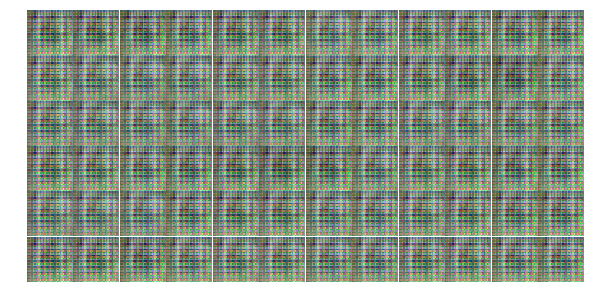

Epoch 6/10... Qfunction Loss: 0.10288741439580917 Generator Loss: 16.542232513427734 Discriminator Loss: 0.0010795103153213859
Epoch 6/10... Qfunction Loss: 0.13032080233097076 Generator Loss: 16.609088897705078 Discriminator Loss: 0.004670952912420034
Epoch 6/10... Qfunction Loss: 0.14608530700206757 Generator Loss: 19.696949005126953 Discriminator Loss: 0.0008032310288399458
Epoch 6/10... Qfunction Loss: 0.1632678359746933 Generator Loss: 16.76430892944336 Discriminator Loss: 0.002757330657914281
Epoch 6/10... Qfunction Loss: 0.19648230075836182 Generator Loss: 19.272964477539062 Discriminator Loss: 0.00023679935839027166
Epoch 6/10... Qfunction Loss: 0.2633495032787323 Generator Loss: 21.78485870361328 Discriminator Loss: 0.0002037232043221593
Epoch 6/10... Qfunction Loss: 0.3489932715892792 Generator Loss: 19.558238983154297 Discriminator Loss: 0.00021254172315821052
Epoch 6/10... Qfunction Loss: 0.3350423276424408 Generator Loss: 22.34219741821289 Discriminator Loss: 0.00022913707

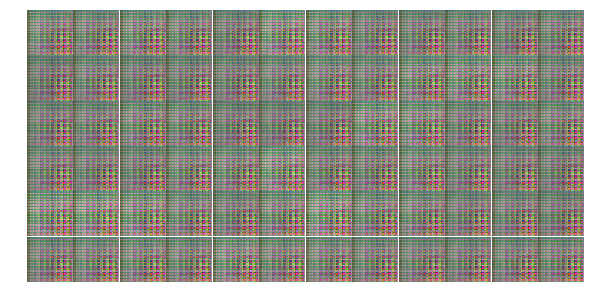

Epoch 6/10... Qfunction Loss: 0.17533987760543823 Generator Loss: 21.17426300048828 Discriminator Loss: 0.0004024772788397968
Epoch 6/10... Qfunction Loss: 0.13068443536758423 Generator Loss: 17.749980926513672 Discriminator Loss: 0.0013033071300014853
Epoch 6/10... Qfunction Loss: 0.0990074872970581 Generator Loss: 17.402936935424805 Discriminator Loss: 0.000554002879653126
Epoch 6/10... Qfunction Loss: 0.07325688004493713 Generator Loss: 21.699073791503906 Discriminator Loss: 9.216582111548632e-05
Epoch 6/10... Qfunction Loss: 0.06966589391231537 Generator Loss: 14.352579116821289 Discriminator Loss: 0.00441224779933691
Epoch 6/10... Qfunction Loss: 0.07542958855628967 Generator Loss: 19.031940460205078 Discriminator Loss: 0.00023564358707517385
Epoch 6/10... Qfunction Loss: 0.09064891189336777 Generator Loss: 15.900422096252441 Discriminator Loss: 0.0018550046952441335
Epoch 6/10... Qfunction Loss: 0.10083425045013428 Generator Loss: 20.696962356567383 Discriminator Loss: 0.00032504

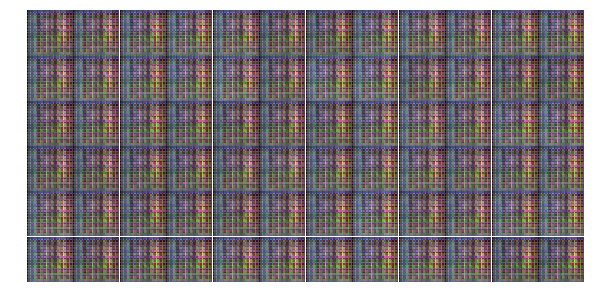

Epoch 6/10... Qfunction Loss: 0.1368369460105896 Generator Loss: 30.046232223510742 Discriminator Loss: 0.00021715121692977846
Epoch 6/10... Qfunction Loss: 0.19737154245376587 Generator Loss: 16.502355575561523 Discriminator Loss: 0.0011282634222880006
Epoch 6/10... Qfunction Loss: 0.2249535322189331 Generator Loss: 15.025110244750977 Discriminator Loss: 0.0028088632971048355
Epoch 6/10... Qfunction Loss: 0.18393658101558685 Generator Loss: 16.583532333374023 Discriminator Loss: 0.001006648875772953
Epoch 6/10... Qfunction Loss: 0.16258813440799713 Generator Loss: 21.32872200012207 Discriminator Loss: 0.00011713226558640599
Epoch 6/10... Qfunction Loss: 0.1917964220046997 Generator Loss: 20.17892837524414 Discriminator Loss: 0.0002659048477653414
Epoch 6/10... Qfunction Loss: 0.24632567167282104 Generator Loss: 22.391590118408203 Discriminator Loss: 0.00023660872830078006
Epoch 6/10... Qfunction Loss: 0.211824432015419 Generator Loss: 21.531808853149414 Discriminator Loss: 0.003485118

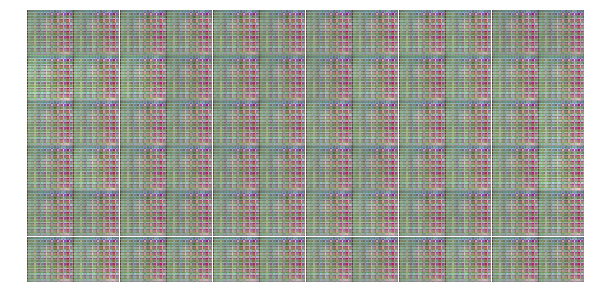

Epoch 6/10... Qfunction Loss: 0.1414738893508911 Generator Loss: 17.440698623657227 Discriminator Loss: 0.0008272562990896404
Epoch 6/10... Qfunction Loss: 0.13677440583705902 Generator Loss: 20.194541931152344 Discriminator Loss: 0.00023706052161287516
Epoch 6/10... Qfunction Loss: 0.13252896070480347 Generator Loss: 25.554887771606445 Discriminator Loss: 0.00024029400083236396
Epoch 6/10... Qfunction Loss: 0.15048733353614807 Generator Loss: 28.16921615600586 Discriminator Loss: 0.00010173028567805886
Epoch 6/10... Qfunction Loss: 0.1928604692220688 Generator Loss: 20.228004455566406 Discriminator Loss: 0.00020854624744970351
Epoch 6/10... Qfunction Loss: 0.27953997254371643 Generator Loss: 18.491113662719727 Discriminator Loss: 0.00038762736949138343
Epoch 6/10... Qfunction Loss: 0.4901235103607178 Generator Loss: 20.557334899902344 Discriminator Loss: 0.00021203361393418163
Epoch 6/10... Qfunction Loss: 0.27163684368133545 Generator Loss: 23.721908569335938 Discriminator Loss: 0.00

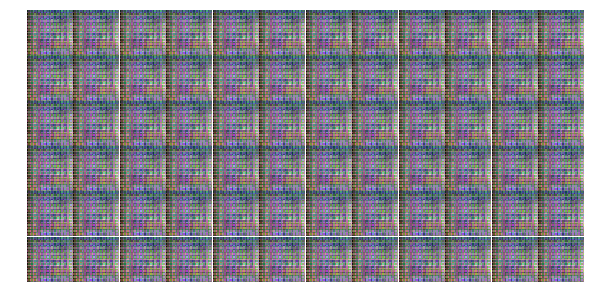

Epoch 6/10... Qfunction Loss: 0.2258019894361496 Generator Loss: 12.767797470092773 Discriminator Loss: 0.011811153963208199
Epoch 6/10... Qfunction Loss: 0.28054937720298767 Generator Loss: 12.984552383422852 Discriminator Loss: 0.006499508395791054
Epoch 6/10... Qfunction Loss: 0.31955859065055847 Generator Loss: 14.379190444946289 Discriminator Loss: 0.004041129723191261
Epoch 7/10... Qfunction Loss: 0.4531940221786499 Generator Loss: 16.646921157836914 Discriminator Loss: 0.0010011165868490934
Epoch 7/10... Qfunction Loss: 0.6633531451225281 Generator Loss: 16.231409072875977 Discriminator Loss: 0.0008718209573999047
Epoch 7/10... Qfunction Loss: 0.7067814469337463 Generator Loss: 13.757102966308594 Discriminator Loss: 0.0065595125779509544
Epoch 7/10... Qfunction Loss: 0.8653714060783386 Generator Loss: 16.777469635009766 Discriminator Loss: 0.0007050957647152245
Epoch 7/10... Qfunction Loss: 0.8313477635383606 Generator Loss: 21.0444278717041 Discriminator Loss: 0.001144780428148

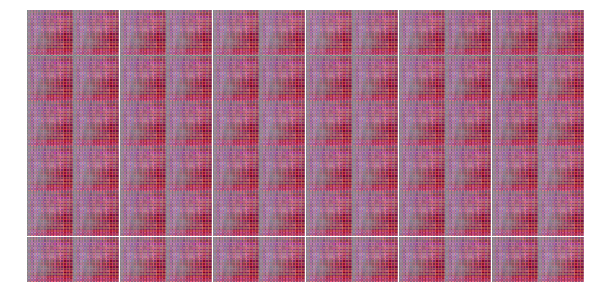

Epoch 7/10... Qfunction Loss: 0.6329839825630188 Generator Loss: 17.549114227294922 Discriminator Loss: 0.0008581405272707343
Epoch 7/10... Qfunction Loss: 0.5482900142669678 Generator Loss: 20.896366119384766 Discriminator Loss: 0.00040811640792526305
Epoch 7/10... Qfunction Loss: 0.532335638999939 Generator Loss: 16.501182556152344 Discriminator Loss: 0.0012361150002107024
Epoch 7/10... Qfunction Loss: 0.6948328018188477 Generator Loss: 16.851455688476562 Discriminator Loss: 0.0007291253423318267
Epoch 7/10... Qfunction Loss: 0.7676900029182434 Generator Loss: 20.72736358642578 Discriminator Loss: 0.0002210532984463498
Epoch 7/10... Qfunction Loss: 0.8117706179618835 Generator Loss: 18.902259826660156 Discriminator Loss: 0.0006456163246184587
Epoch 7/10... Qfunction Loss: 0.7523967623710632 Generator Loss: 20.4302978515625 Discriminator Loss: 0.00036457538953982294
Epoch 7/10... Qfunction Loss: 0.7217752933502197 Generator Loss: 23.545570373535156 Discriminator Loss: 0.00044649647315

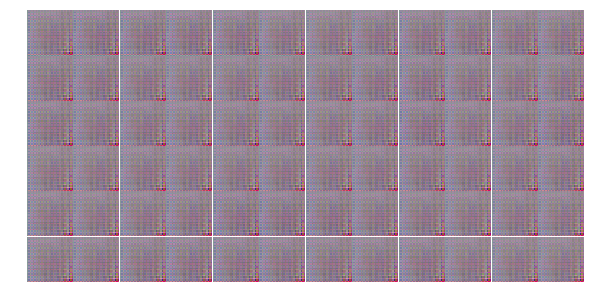

Epoch 7/10... Qfunction Loss: 0.6739327311515808 Generator Loss: 14.482915878295898 Discriminator Loss: 0.00448286347091198
Epoch 7/10... Qfunction Loss: 0.6295039057731628 Generator Loss: 23.362049102783203 Discriminator Loss: 0.0034837855491787195
Epoch 7/10... Qfunction Loss: 0.5172324180603027 Generator Loss: 21.376201629638672 Discriminator Loss: 0.0003919275477528572
Epoch 7/10... Qfunction Loss: 0.39400842785835266 Generator Loss: 20.954158782958984 Discriminator Loss: 0.000341725506586954
Epoch 7/10... Qfunction Loss: 0.346419095993042 Generator Loss: 16.648780822753906 Discriminator Loss: 0.0006893459940329194
Epoch 7/10... Qfunction Loss: 0.3189122974872589 Generator Loss: 22.218198776245117 Discriminator Loss: 0.0008125941967591643
Epoch 7/10... Qfunction Loss: 0.32937613129615784 Generator Loss: 17.546104431152344 Discriminator Loss: 0.0005235279677435756
Epoch 7/10... Qfunction Loss: 0.3554270565509796 Generator Loss: 16.462263107299805 Discriminator Loss: 0.00086812768131

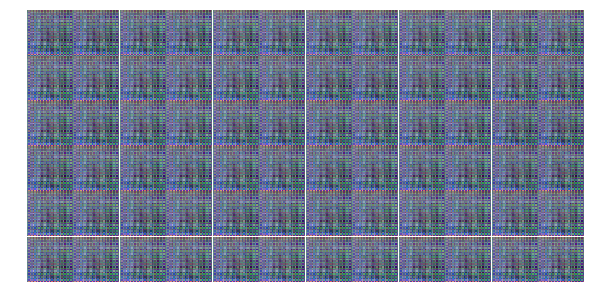

Epoch 7/10... Qfunction Loss: 0.2685677707195282 Generator Loss: 15.492473602294922 Discriminator Loss: 0.001726610935293138
Epoch 7/10... Qfunction Loss: 0.2783668339252472 Generator Loss: 18.911481857299805 Discriminator Loss: 0.00032299073063768446
Epoch 7/10... Qfunction Loss: 0.2982759475708008 Generator Loss: 19.29636573791504 Discriminator Loss: 0.0003257719217799604
Epoch 7/10... Qfunction Loss: 0.28767845034599304 Generator Loss: 27.498157501220703 Discriminator Loss: 0.0002345907996641472
Epoch 7/10... Qfunction Loss: 0.2819722294807434 Generator Loss: 15.2354736328125 Discriminator Loss: 0.00311737647280097
Epoch 7/10... Qfunction Loss: 0.2778395116329193 Generator Loss: 21.585403442382812 Discriminator Loss: 6.757157825632021e-05
Epoch 7/10... Qfunction Loss: 0.27496981620788574 Generator Loss: 19.394704818725586 Discriminator Loss: 0.0007339949952438474
Epoch 7/10... Qfunction Loss: 0.2458198517560959 Generator Loss: 19.986740112304688 Discriminator Loss: 0.000826966890599

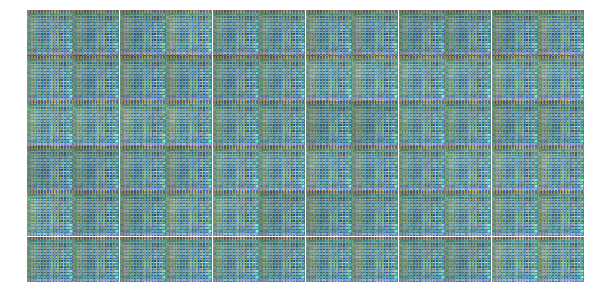

Epoch 7/10... Qfunction Loss: 0.15413998067378998 Generator Loss: 13.673215866088867 Discriminator Loss: 0.0042799366638064384
Epoch 7/10... Qfunction Loss: 0.1542162299156189 Generator Loss: 28.67462158203125 Discriminator Loss: 0.00034056208096444607
Epoch 7/10... Qfunction Loss: 0.1538621336221695 Generator Loss: 23.703144073486328 Discriminator Loss: 0.0004214237560518086
Epoch 7/10... Qfunction Loss: 0.146250382065773 Generator Loss: 23.508464813232422 Discriminator Loss: 0.0004532575258053839
Epoch 7/10... Qfunction Loss: 0.16804276406764984 Generator Loss: 24.377708435058594 Discriminator Loss: 0.0007945919642224908
Epoch 7/10... Qfunction Loss: 0.1811397820711136 Generator Loss: 26.779071807861328 Discriminator Loss: 0.0019626859575510025
Epoch 7/10... Qfunction Loss: 0.2040373533964157 Generator Loss: 21.75153160095215 Discriminator Loss: 0.00010210266191279516
Epoch 7/10... Qfunction Loss: 0.24119623005390167 Generator Loss: 18.781909942626953 Discriminator Loss: 0.0003031228

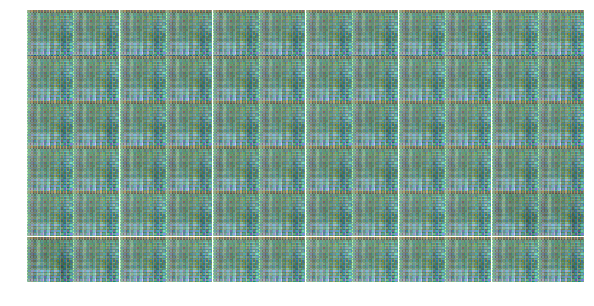

Epoch 7/10... Qfunction Loss: 0.39823755621910095 Generator Loss: 16.469791412353516 Discriminator Loss: 0.0009101153118535876
Epoch 7/10... Qfunction Loss: 0.3979426622390747 Generator Loss: 18.269668579101562 Discriminator Loss: 0.0009334309725090861
Epoch 7/10... Qfunction Loss: 0.4371166229248047 Generator Loss: 24.59557342529297 Discriminator Loss: 0.05854303017258644
Epoch 7/10... Qfunction Loss: 0.2673419415950775 Generator Loss: 17.242328643798828 Discriminator Loss: 0.009176809340715408
Epoch 7/10... Qfunction Loss: 0.13767528533935547 Generator Loss: 17.18708038330078 Discriminator Loss: 0.0024250647984445095
Epoch 7/10... Qfunction Loss: 0.07239768654108047 Generator Loss: 19.82316780090332 Discriminator Loss: 0.00039216020377352834
Epoch 7/10... Qfunction Loss: 0.08937457203865051 Generator Loss: 21.51700210571289 Discriminator Loss: 0.019268155097961426
Epoch 7/10... Qfunction Loss: 0.15916429460048676 Generator Loss: 23.242877960205078 Discriminator Loss: 0.00191052537411

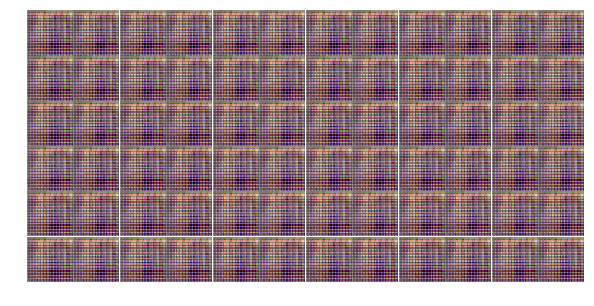

Epoch 7/10... Qfunction Loss: 0.5698867440223694 Generator Loss: 24.059595108032227 Discriminator Loss: 0.0003426061011850834
Epoch 8/10... Qfunction Loss: 0.5031138062477112 Generator Loss: 21.148128509521484 Discriminator Loss: 0.00016957953630480915
Epoch 8/10... Qfunction Loss: 0.5471622347831726 Generator Loss: 26.078454971313477 Discriminator Loss: 0.0004147933213971555
Epoch 8/10... Qfunction Loss: 0.5669246315956116 Generator Loss: 19.687583923339844 Discriminator Loss: 0.00320232380181551
Epoch 8/10... Qfunction Loss: 0.5677102208137512 Generator Loss: 25.036291122436523 Discriminator Loss: 0.0005440310342237353
Epoch 8/10... Qfunction Loss: 0.6721886992454529 Generator Loss: 16.507816314697266 Discriminator Loss: 0.00387326767668128
Epoch 8/10... Qfunction Loss: 0.4245975911617279 Generator Loss: 18.43866729736328 Discriminator Loss: 0.0007344373734667897
Epoch 8/10... Qfunction Loss: 0.30932673811912537 Generator Loss: 28.270946502685547 Discriminator Loss: 0.001065251184627

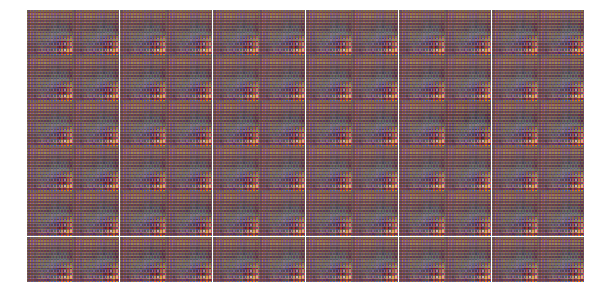

Epoch 8/10... Qfunction Loss: 0.3742680549621582 Generator Loss: 17.759166717529297 Discriminator Loss: 0.001198931597173214
Epoch 8/10... Qfunction Loss: 0.434976726770401 Generator Loss: 28.275524139404297 Discriminator Loss: 0.00015233183512464166
Epoch 8/10... Qfunction Loss: 0.5152591466903687 Generator Loss: 18.756492614746094 Discriminator Loss: 0.0006444706814363599
Epoch 8/10... Qfunction Loss: 0.5898553729057312 Generator Loss: 32.52228546142578 Discriminator Loss: 0.000249445962253958
Epoch 8/10... Qfunction Loss: 0.6045830249786377 Generator Loss: 25.435436248779297 Discriminator Loss: 0.00024386912991758436
Epoch 8/10... Qfunction Loss: 0.502418577671051 Generator Loss: 18.422290802001953 Discriminator Loss: 0.004577667452394962
Epoch 8/10... Qfunction Loss: 0.29810428619384766 Generator Loss: 11.333372116088867 Discriminator Loss: 0.03637637943029404
Epoch 8/10... Qfunction Loss: 0.11657281965017319 Generator Loss: 14.44029426574707 Discriminator Loss: 0.00622680271044373

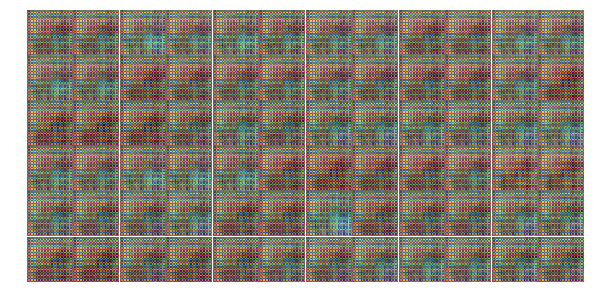

Epoch 8/10... Qfunction Loss: 0.03626955673098564 Generator Loss: 13.933714866638184 Discriminator Loss: 0.006025410257279873
Epoch 8/10... Qfunction Loss: 0.031170682981610298 Generator Loss: 22.518089294433594 Discriminator Loss: 0.016277173534035683
Epoch 8/10... Qfunction Loss: 0.034345079213380814 Generator Loss: 24.81616973876953 Discriminator Loss: 0.0011179381981492043
Epoch 8/10... Qfunction Loss: 0.03570067510008812 Generator Loss: 18.907991409301758 Discriminator Loss: 0.002176379319280386
Epoch 8/10... Qfunction Loss: 0.043623026460409164 Generator Loss: 13.091521263122559 Discriminator Loss: 0.010208227671682835
Epoch 8/10... Qfunction Loss: 0.05794527009129524 Generator Loss: 25.581287384033203 Discriminator Loss: 0.0013589290902018547
Epoch 8/10... Qfunction Loss: 0.1014033779501915 Generator Loss: 15.914714813232422 Discriminator Loss: 0.005222773645073175
Epoch 8/10... Qfunction Loss: 0.10237172991037369 Generator Loss: 25.32367706298828 Discriminator Loss: 0.000831082

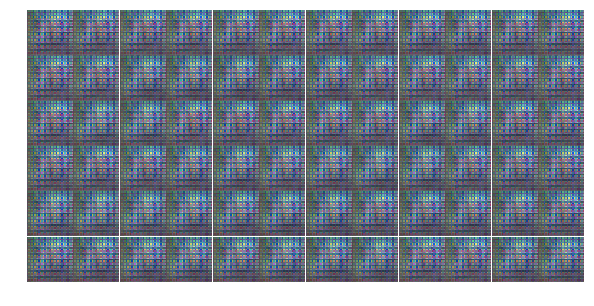

Epoch 8/10... Qfunction Loss: 0.4469884932041168 Generator Loss: 20.035831451416016 Discriminator Loss: 0.00029556298977695405
Epoch 8/10... Qfunction Loss: 0.7338294982910156 Generator Loss: 22.932222366333008 Discriminator Loss: 8.683880878379568e-05
Epoch 8/10... Qfunction Loss: 0.7416958808898926 Generator Loss: 19.775480270385742 Discriminator Loss: 0.00024599512107670307
Epoch 8/10... Qfunction Loss: 0.6458204388618469 Generator Loss: 18.834413528442383 Discriminator Loss: 0.0007018722826614976
Epoch 8/10... Qfunction Loss: 0.6696210503578186 Generator Loss: 15.674215316772461 Discriminator Loss: 0.0027704895474016666
Epoch 8/10... Qfunction Loss: 0.7467618584632874 Generator Loss: 18.903043746948242 Discriminator Loss: 0.0021352549083530903
Epoch 8/10... Qfunction Loss: 0.5999445915222168 Generator Loss: 17.297954559326172 Discriminator Loss: 0.0034214602783322334
Epoch 8/10... Qfunction Loss: 0.39449599385261536 Generator Loss: 18.76998519897461 Discriminator Loss: 0.0196482967

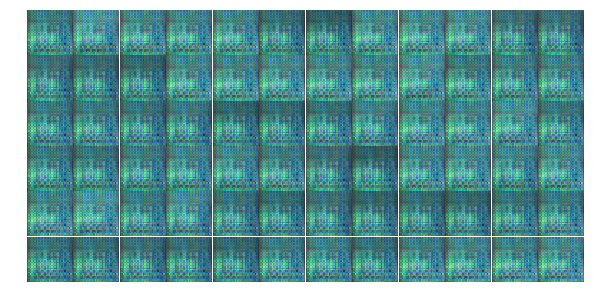

Epoch 8/10... Qfunction Loss: 0.0605461448431015 Generator Loss: 19.240093231201172 Discriminator Loss: 0.004856566432863474
Epoch 8/10... Qfunction Loss: 0.05561216548085213 Generator Loss: 14.622793197631836 Discriminator Loss: 0.019080618396401405
Epoch 8/10... Qfunction Loss: 0.08402832597494125 Generator Loss: 18.16675567626953 Discriminator Loss: 0.0013081301003694534
Epoch 8/10... Qfunction Loss: 0.11133607476949692 Generator Loss: 22.517349243164062 Discriminator Loss: 0.0004979581572115421
Epoch 8/10... Qfunction Loss: 0.2568556070327759 Generator Loss: 17.643234252929688 Discriminator Loss: 0.0016341026639565825
Epoch 8/10... Qfunction Loss: 0.23303891718387604 Generator Loss: 17.93744468688965 Discriminator Loss: 0.0007890952983871102
Epoch 8/10... Qfunction Loss: 0.304559588432312 Generator Loss: 26.58492088317871 Discriminator Loss: 0.006593871396034956
Epoch 8/10... Qfunction Loss: 0.360821932554245 Generator Loss: 22.53483009338379 Discriminator Loss: 0.00080354936653748

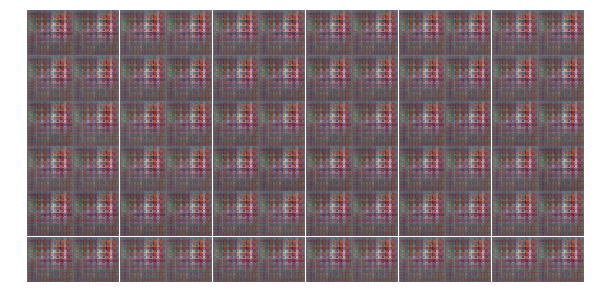

Epoch 8/10... Qfunction Loss: 0.9008502960205078 Generator Loss: 22.743501663208008 Discriminator Loss: 0.0004474642628338188
Epoch 8/10... Qfunction Loss: 0.9182636141777039 Generator Loss: 15.901029586791992 Discriminator Loss: 0.0013101883232593536
Epoch 8/10... Qfunction Loss: 0.9694352149963379 Generator Loss: 18.123043060302734 Discriminator Loss: 0.0008264519274234772
Epoch 8/10... Qfunction Loss: 0.8824706673622131 Generator Loss: 15.251745223999023 Discriminator Loss: 0.0030592477414757013
Epoch 8/10... Qfunction Loss: 0.6414888501167297 Generator Loss: 15.067863464355469 Discriminator Loss: 0.0034129794221371412
Epoch 8/10... Qfunction Loss: 0.35765013098716736 Generator Loss: 10.42779541015625 Discriminator Loss: 0.030615918338298798
Epoch 8/10... Qfunction Loss: 0.2030569314956665 Generator Loss: 13.773670196533203 Discriminator Loss: 0.010877461172640324
Epoch 8/10... Qfunction Loss: 0.22469352185726166 Generator Loss: 28.817615509033203 Discriminator Loss: 0.0092458119615

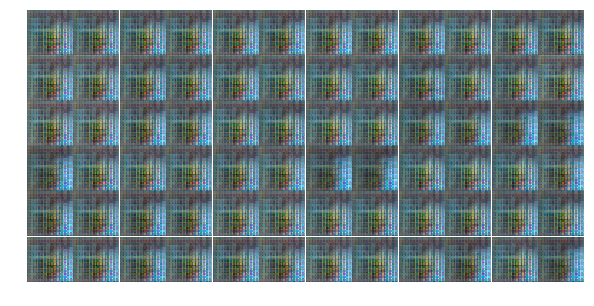

Epoch 9/10... Qfunction Loss: 0.7445612549781799 Generator Loss: 25.4833984375 Discriminator Loss: 9.09146765479818e-05
Epoch 9/10... Qfunction Loss: 1.0443922281265259 Generator Loss: 21.996139526367188 Discriminator Loss: 0.0005933208740316331
Epoch 9/10... Qfunction Loss: 1.1186639070510864 Generator Loss: 18.685855865478516 Discriminator Loss: 0.0005083914147689939
Epoch 9/10... Qfunction Loss: 1.216936469078064 Generator Loss: 19.993446350097656 Discriminator Loss: 0.0001818899909267202
Epoch 9/10... Qfunction Loss: 1.3958522081375122 Generator Loss: 18.73661231994629 Discriminator Loss: 0.00033523805905133486
Epoch 9/10... Qfunction Loss: 1.4130611419677734 Generator Loss: 18.11347007751465 Discriminator Loss: 0.0005796179175376892
Epoch 9/10... Qfunction Loss: 1.1512846946716309 Generator Loss: 13.851521492004395 Discriminator Loss: 0.01866995543241501
Epoch 9/10... Qfunction Loss: 0.9625975489616394 Generator Loss: 13.922378540039062 Discriminator Loss: 0.016804613173007965
Epo

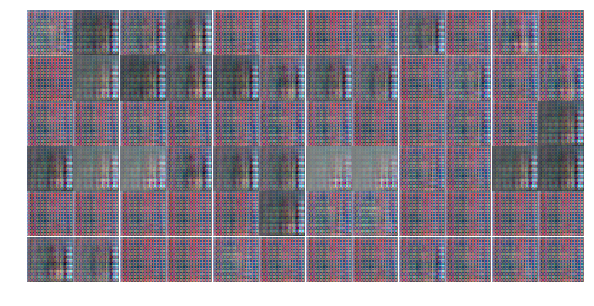

Epoch 9/10... Qfunction Loss: 0.6752745509147644 Generator Loss: 12.585857391357422 Discriminator Loss: 0.028429072350263596
Epoch 9/10... Qfunction Loss: 0.3636722266674042 Generator Loss: 13.934444427490234 Discriminator Loss: 0.007255460135638714
Epoch 9/10... Qfunction Loss: 0.2521354854106903 Generator Loss: 7.302379608154297 Discriminator Loss: 0.4772896468639374
Epoch 9/10... Qfunction Loss: 0.3202104866504669 Generator Loss: 7.973850250244141 Discriminator Loss: 0.15698106586933136
Epoch 9/10... Qfunction Loss: 0.3490649163722992 Generator Loss: 10.030211448669434 Discriminator Loss: 0.049756020307540894
Epoch 9/10... Qfunction Loss: 0.37237071990966797 Generator Loss: 13.309629440307617 Discriminator Loss: 0.017535246908664703
Epoch 9/10... Qfunction Loss: 0.4447576701641083 Generator Loss: 12.381943702697754 Discriminator Loss: 0.015578487887978554
Epoch 9/10... Qfunction Loss: 0.37623628973960876 Generator Loss: 11.888172149658203 Discriminator Loss: 0.011485342867672443
Epo

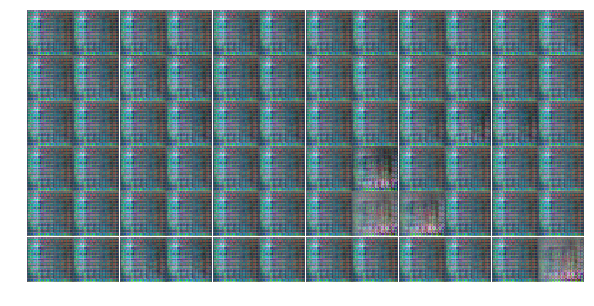

Epoch 9/10... Qfunction Loss: 0.20843946933746338 Generator Loss: 16.937824249267578 Discriminator Loss: 0.0107422498986125
Epoch 9/10... Qfunction Loss: 0.17051111161708832 Generator Loss: 17.482894897460938 Discriminator Loss: 0.004342354368418455
Epoch 9/10... Qfunction Loss: 0.14719976484775543 Generator Loss: 19.46973991394043 Discriminator Loss: 0.0028250482864677906
Epoch 9/10... Qfunction Loss: 0.10643919557332993 Generator Loss: 15.930030822753906 Discriminator Loss: 0.001556148985400796
Epoch 9/10... Qfunction Loss: 0.08704337477684021 Generator Loss: 13.075141906738281 Discriminator Loss: 0.008780479431152344
Epoch 9/10... Qfunction Loss: 0.07362034171819687 Generator Loss: 17.28676986694336 Discriminator Loss: 2.3967583179473877
Epoch 9/10... Qfunction Loss: 0.061812758445739746 Generator Loss: 13.904702186584473 Discriminator Loss: 0.03185288980603218
Epoch 9/10... Qfunction Loss: 0.08444627374410629 Generator Loss: 14.168991088867188 Discriminator Loss: 0.0118800662457942

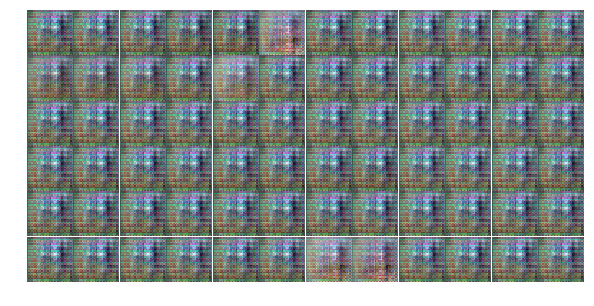

Epoch 9/10... Qfunction Loss: 0.3552490174770355 Generator Loss: 14.321733474731445 Discriminator Loss: 0.0046991403214633465
Epoch 9/10... Qfunction Loss: 0.4511019289493561 Generator Loss: 15.477046966552734 Discriminator Loss: 0.016723530367016792
Epoch 9/10... Qfunction Loss: 0.4577106237411499 Generator Loss: 17.86985206604004 Discriminator Loss: 0.00256868707947433
Epoch 9/10... Qfunction Loss: 0.524773359298706 Generator Loss: 18.719581604003906 Discriminator Loss: 0.0008561444701626897
Epoch 9/10... Qfunction Loss: 0.6370715498924255 Generator Loss: 20.46632957458496 Discriminator Loss: 0.000829635770060122
Epoch 9/10... Qfunction Loss: 0.6402432322502136 Generator Loss: 17.349998474121094 Discriminator Loss: 0.0038837166503071785
Epoch 9/10... Qfunction Loss: 0.8164427876472473 Generator Loss: 16.240676879882812 Discriminator Loss: 0.009601188823580742
Epoch 9/10... Qfunction Loss: 0.8080717921257019 Generator Loss: 12.572763442993164 Discriminator Loss: 0.008328711614012718
E

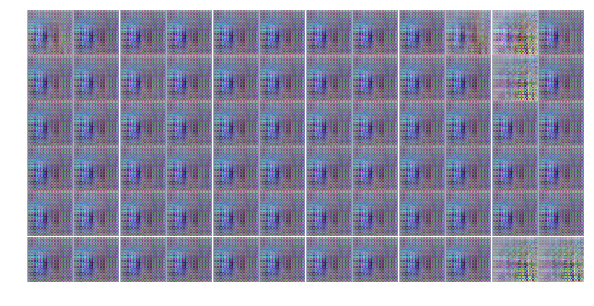

Epoch 9/10... Qfunction Loss: 0.8102648854255676 Generator Loss: 14.940134048461914 Discriminator Loss: 0.0028516463935375214
Epoch 9/10... Qfunction Loss: 0.7359336018562317 Generator Loss: 18.46901512145996 Discriminator Loss: 0.0007018150063231587
Epoch 9/10... Qfunction Loss: 0.6626328825950623 Generator Loss: 15.705894470214844 Discriminator Loss: 0.002403688384220004
Epoch 9/10... Qfunction Loss: 0.6369758248329163 Generator Loss: 14.95590877532959 Discriminator Loss: 0.004603398963809013
Epoch 9/10... Qfunction Loss: 0.6073529124259949 Generator Loss: 20.84303855895996 Discriminator Loss: 0.0016544361133128405
Epoch 9/10... Qfunction Loss: 0.5725154280662537 Generator Loss: 19.73418426513672 Discriminator Loss: 0.00027882010908797383
Epoch 9/10... Qfunction Loss: 0.5515311360359192 Generator Loss: 13.587430953979492 Discriminator Loss: 0.00828758254647255
Epoch 9/10... Qfunction Loss: 0.5560259819030762 Generator Loss: 16.35043716430664 Discriminator Loss: 0.0014730356633663177


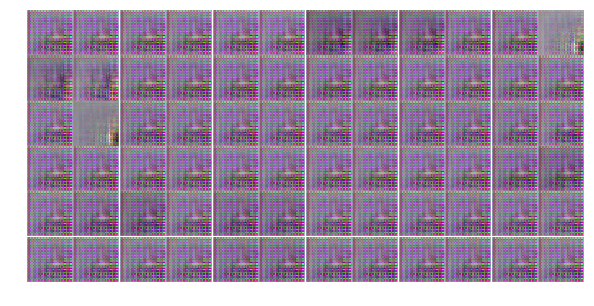

Epoch 9/10... Qfunction Loss: 0.6275023818016052 Generator Loss: 15.53719711303711 Discriminator Loss: 0.005087807774543762
Epoch 9/10... Qfunction Loss: 0.6963527798652649 Generator Loss: 16.285493850708008 Discriminator Loss: 0.0013566818088293076
Epoch 9/10... Qfunction Loss: 0.6981814503669739 Generator Loss: 20.971359252929688 Discriminator Loss: 0.0002513888175599277
Epoch 9/10... Qfunction Loss: 0.7015672326087952 Generator Loss: 17.15668487548828 Discriminator Loss: 0.0008222306496463716
Epoch 9/10... Qfunction Loss: 0.6500717997550964 Generator Loss: 18.42914390563965 Discriminator Loss: 0.0016376946587115526
Epoch 10/10... Qfunction Loss: 0.6256909370422363 Generator Loss: 17.693761825561523 Discriminator Loss: 0.0027344594709575176
Epoch 10/10... Qfunction Loss: 0.6106483340263367 Generator Loss: 19.345218658447266 Discriminator Loss: 0.0003604562079999596
Epoch 10/10... Qfunction Loss: 0.5801753997802734 Generator Loss: 17.555709838867188 Discriminator Loss: 0.0048723192885

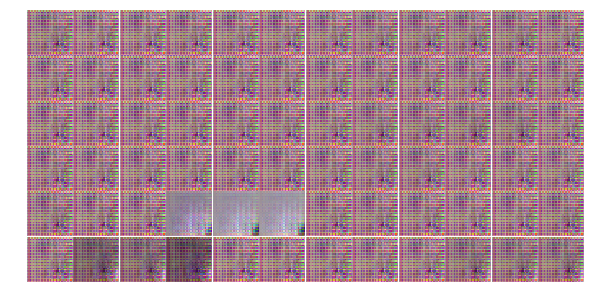

Epoch 10/10... Qfunction Loss: 0.4533168375492096 Generator Loss: 17.101118087768555 Discriminator Loss: 0.0018082500901073217
Epoch 10/10... Qfunction Loss: 0.4348582327365875 Generator Loss: 20.267269134521484 Discriminator Loss: 0.00018789562454912812
Epoch 10/10... Qfunction Loss: 0.34053072333335876 Generator Loss: 16.02591896057129 Discriminator Loss: 0.0012553846463561058
Epoch 10/10... Qfunction Loss: 0.25356706976890564 Generator Loss: 18.09014129638672 Discriminator Loss: 0.001042860560119152
Epoch 10/10... Qfunction Loss: 0.22683016955852509 Generator Loss: 14.925337791442871 Discriminator Loss: 0.0026991809718310833
Epoch 10/10... Qfunction Loss: 0.20161378383636475 Generator Loss: 20.419456481933594 Discriminator Loss: 0.0009119815658777952
Epoch 10/10... Qfunction Loss: 0.11518008261919022 Generator Loss: 18.76201629638672 Discriminator Loss: 0.006436517462134361
Epoch 10/10... Qfunction Loss: 0.09364870935678482 Generator Loss: 17.70672607421875 Discriminator Loss: 0.000

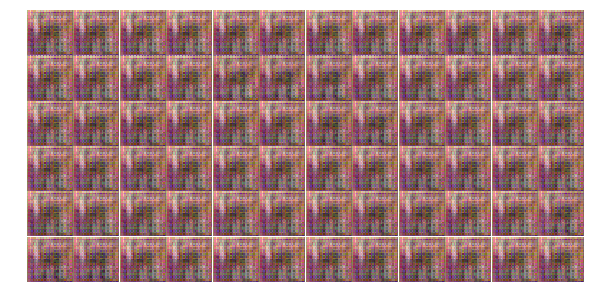

Epoch 10/10... Qfunction Loss: 0.07016768306493759 Generator Loss: 17.211645126342773 Discriminator Loss: 0.0008764411322772503
Epoch 10/10... Qfunction Loss: 0.05704577639698982 Generator Loss: 17.449905395507812 Discriminator Loss: 0.0017703567864373326
Epoch 10/10... Qfunction Loss: 0.052409231662750244 Generator Loss: 16.80585479736328 Discriminator Loss: 0.0019252992933616042
Epoch 10/10... Qfunction Loss: 0.054120153188705444 Generator Loss: 17.70995330810547 Discriminator Loss: 0.0014345955569297075
Epoch 10/10... Qfunction Loss: 0.06020943447947502 Generator Loss: 18.065181732177734 Discriminator Loss: 0.0013073774753138423
Epoch 10/10... Qfunction Loss: 0.04852370545268059 Generator Loss: 18.18486785888672 Discriminator Loss: 0.0017251515528187156
Epoch 10/10... Qfunction Loss: 0.05245479941368103 Generator Loss: 26.600177764892578 Discriminator Loss: 0.01834193617105484
Epoch 10/10... Qfunction Loss: 0.08188352733850479 Generator Loss: 21.483625411987305 Discriminator Loss: 0

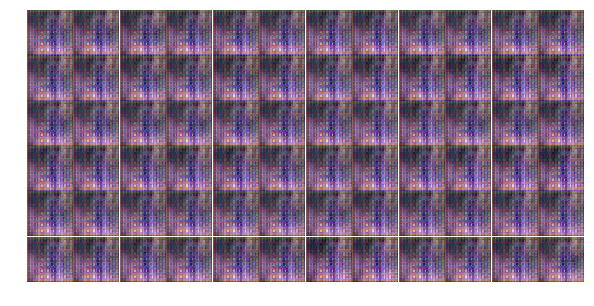

Epoch 10/10... Qfunction Loss: 0.1294562816619873 Generator Loss: 22.747394561767578 Discriminator Loss: 0.0002936743258032948
Epoch 10/10... Qfunction Loss: 0.14178931713104248 Generator Loss: 23.311948776245117 Discriminator Loss: 0.00022051432461012155
Epoch 10/10... Qfunction Loss: 0.09932166337966919 Generator Loss: 17.80611801147461 Discriminator Loss: 0.0028158745262771845
Epoch 10/10... Qfunction Loss: 0.21471504867076874 Generator Loss: 20.60322380065918 Discriminator Loss: 0.001226589665748179
Epoch 10/10... Qfunction Loss: 0.26994165778160095 Generator Loss: 24.243032455444336 Discriminator Loss: 7.792524411343038e-05
Epoch 10/10... Qfunction Loss: 0.25856107473373413 Generator Loss: 27.48781967163086 Discriminator Loss: 1.5734203770989552e-05
Epoch 10/10... Qfunction Loss: 0.18896691501140594 Generator Loss: 18.97833251953125 Discriminator Loss: 0.000413205852964893
Epoch 10/10... Qfunction Loss: 0.18435202538967133 Generator Loss: 18.801082611083984 Discriminator Loss: 0.0

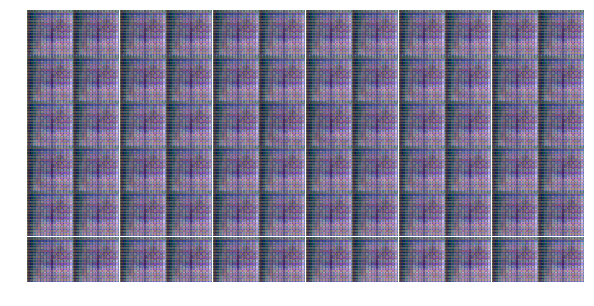

Epoch 10/10... Qfunction Loss: 0.31677332520484924 Generator Loss: 21.62563705444336 Discriminator Loss: 0.0002059603575617075
Epoch 10/10... Qfunction Loss: 0.2600546181201935 Generator Loss: 24.780132293701172 Discriminator Loss: 0.0002984802413266152
Epoch 10/10... Qfunction Loss: 0.39198318123817444 Generator Loss: 26.952194213867188 Discriminator Loss: 5.926440280745737e-05
Epoch 10/10... Qfunction Loss: 0.28618156909942627 Generator Loss: 11.037846565246582 Discriminator Loss: 1.401564359664917
Epoch 10/10... Qfunction Loss: 0.1217522993683815 Generator Loss: 16.695552825927734 Discriminator Loss: 0.0047750091180205345
Epoch 10/10... Qfunction Loss: 0.06979632377624512 Generator Loss: 14.907544136047363 Discriminator Loss: 0.004946987144649029
Epoch 10/10... Qfunction Loss: 0.058070108294487 Generator Loss: 14.799284934997559 Discriminator Loss: 0.011711559258401394
Epoch 10/10... Qfunction Loss: 0.11411401629447937 Generator Loss: 20.543827056884766 Discriminator Loss: 0.0013773

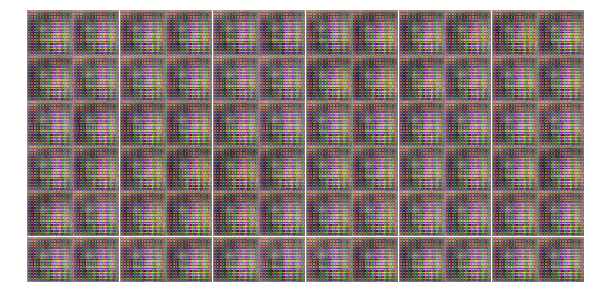

Epoch 10/10... Qfunction Loss: 0.211721733212471 Generator Loss: 19.906612396240234 Discriminator Loss: 0.0019350872607901692
Epoch 10/10... Qfunction Loss: 0.20106656849384308 Generator Loss: 31.398252487182617 Discriminator Loss: 0.00010407360241515562
Epoch 10/10... Qfunction Loss: 0.24881476163864136 Generator Loss: 33.82611083984375 Discriminator Loss: 0.10054702311754227
Epoch 10/10... Qfunction Loss: 0.09865202754735947 Generator Loss: 13.965572357177734 Discriminator Loss: 0.013711226172745228
Epoch 10/10... Qfunction Loss: 0.15286853909492493 Generator Loss: 27.05025291442871 Discriminator Loss: 0.0008679520688019693
Epoch 10/10... Qfunction Loss: 0.17757894098758698 Generator Loss: 33.09584045410156 Discriminator Loss: 0.0003244197287131101
Epoch 10/10... Qfunction Loss: 0.23076455295085907 Generator Loss: 22.29234504699707 Discriminator Loss: 0.005911857355386019
Epoch 10/10... Qfunction Loss: 0.35310664772987366 Generator Loss: 18.543935775756836 Discriminator Loss: 0.00645

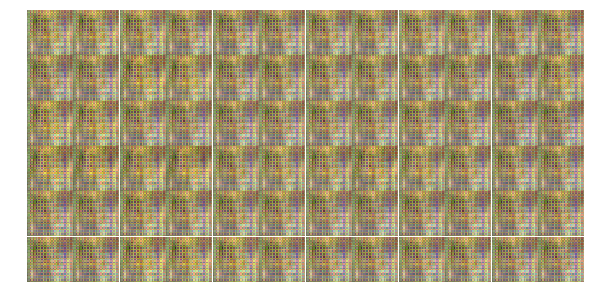

Epoch 10/10... Qfunction Loss: 0.25056812167167664 Generator Loss: 24.473684310913086 Discriminator Loss: 0.0020290014799684286
Epoch 10/10... Qfunction Loss: 0.11495218425989151 Generator Loss: 11.991825103759766 Discriminator Loss: 0.014890586957335472
Epoch 10/10... Qfunction Loss: 0.09751734882593155 Generator Loss: 18.68716049194336 Discriminator Loss: 0.0018948821816593409


In [43]:
losses, samples = train(model=model, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

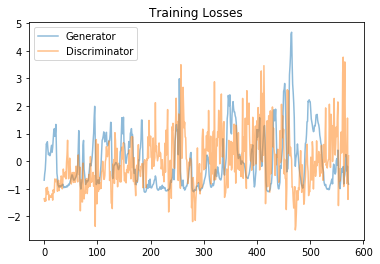

In [44]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
# print(losses_.shape, losses_norm.shape, losses_norm.dtype, losses_norm.dtype)
plt.plot(losses_norm.T[0], label='Generator', alpha=0.5)
plt.plot(losses_norm.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

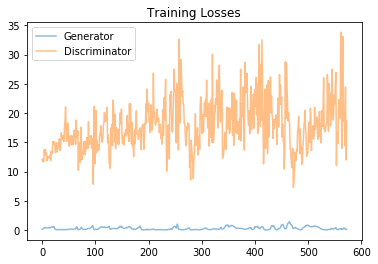

In [45]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
plt.plot(losses_.T[0], label='Generator', alpha=0.5)
plt.plot(losses_.T[1], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


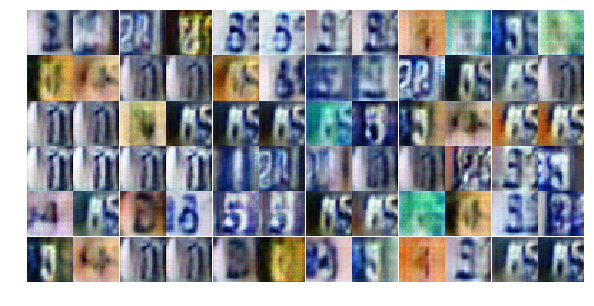

In [51]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

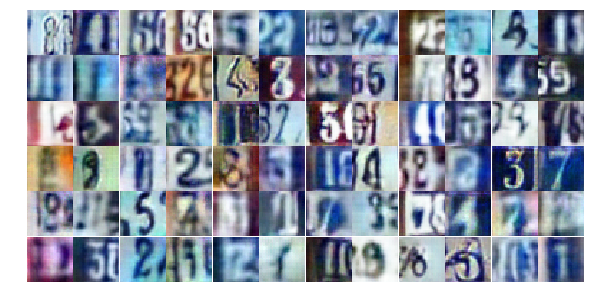

In [19]:
# Standard DCGAN
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))